In [1]:
library(tidyverse)
library(treemap)
library(tm)
library(maps)
library(wordcloud)
library(repr)

Loading tidyverse: ggplot2
Loading tidyverse: tibble
Loading tidyverse: tidyr
Loading tidyverse: readr
Loading tidyverse: purrr
Loading tidyverse: dplyr
Warning message:
“package ‘dplyr’ was built under R version 3.4.2”Conflicts with tidy packages ---------------------------------------------------
filter(): dplyr, stats
lag():    dplyr, stats
Warning message:
“package ‘tm’ was built under R version 3.4.3”Loading required package: NLP

Attaching package: ‘NLP’

The following object is masked from ‘package:ggplot2’:

    annotate


Attaching package: ‘maps’

The following object is masked from ‘package:purrr’:

    map

Loading required package: RColorBrewer


In [2]:
df <- read_csv("globalterrorismdb_0617dist.csv")

Parsed with column specification:
cols(
  .default = col_character(),
  eventid = col_double(),
  iyear = col_integer(),
  imonth = col_integer(),
  iday = col_integer(),
  extended = col_integer(),
  country = col_integer(),
  region = col_integer(),
  latitude = col_double(),
  longitude = col_double(),
  specificity = col_integer(),
  vicinity = col_integer(),
  crit1 = col_integer(),
  crit2 = col_integer(),
  crit3 = col_integer(),
  doubtterr = col_integer(),
  alternative = col_integer(),
  multiple = col_integer(),
  success = col_integer(),
  suicide = col_integer(),
  attacktype1 = col_integer()
  # ... with 44 more columns
)
See spec(...) for full column specifications.
Warning message in rbind(names(probs), probs_f):
“number of columns of result is not a multiple of vector length (arg 1)”Warning message:
“246 parsing failures.
row # A tibble: 5 x 5 col     row       col               expected actual expected   <int>     <chr>                  <chr>  <chr> actual 1  7127    

In [3]:
glimpse(df)

Observations: 170,350
Variables: 135
$ eventid            <dbl> 197000000001, 197000000002, 197001000001, 197001...
$ iyear              <int> 1970, 1970, 1970, 1970, 1970, 1970, 1970, 1970, ...
$ imonth             <int> 7, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...
$ iday               <int> 2, 0, 0, 0, 0, 1, 2, 2, 2, 3, 1, 6, 8, 9, 9, 10,...
$ approxdate         <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, ...
$ extended           <int> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
$ resolution         <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, ...
$ country            <int> 58, 130, 160, 78, 101, 217, 218, 217, 217, 217, ...
$ country_txt        <chr> "Dominican Republic", "Mexico", "Philippines", "...
$ region             <int> 2, 1, 5, 8, 4, 1, 3, 1, 1, 1, 1, 1, 8, 1, 1, 9, ...
$ region_txt         <chr> "Central America & Caribbean", "North America", ...
$ provstate          <chr> NA, NA, "Tarlac", "Attica", NA, "Illinois", "Mon...
$ city         

## **Number of killings per year**
Lets start with how many people get killed through the years

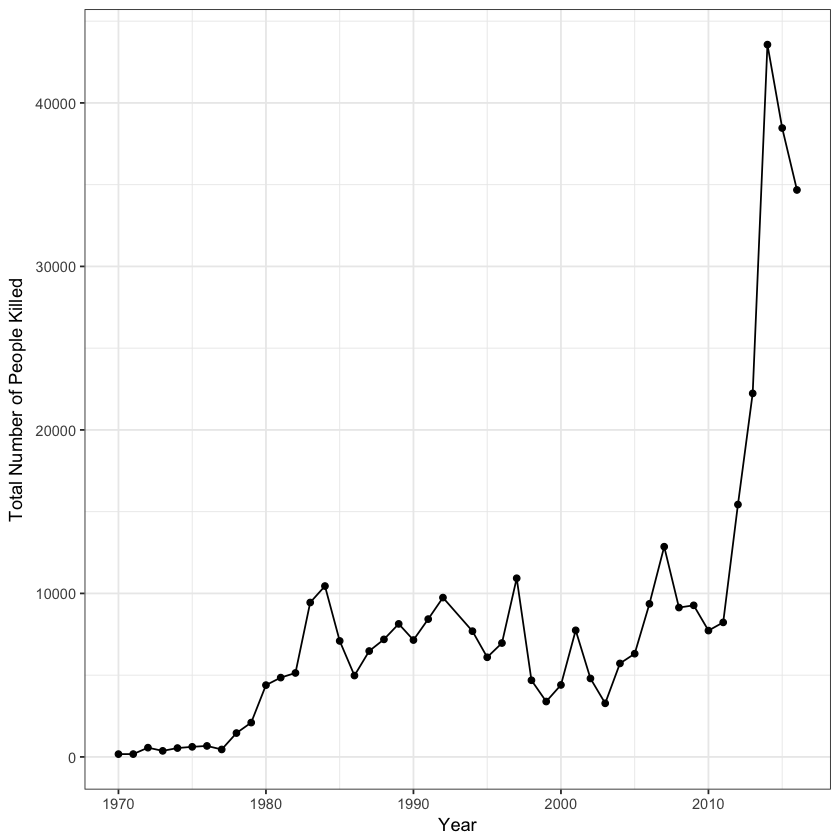

In [4]:
df %>%
group_by(iyear) %>%
summarise(total_kills = sum(nkill, na.rm = TRUE)) %>%
ggplot(aes(iyear, total_kills))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of People Killed")+
theme_bw()

So, we clearly see that the number of killings in terrorism increases with years. Does that mean the terrorists are getting better at killing people? Or it may also mean that the number of terrorist incidents worldwide increased.

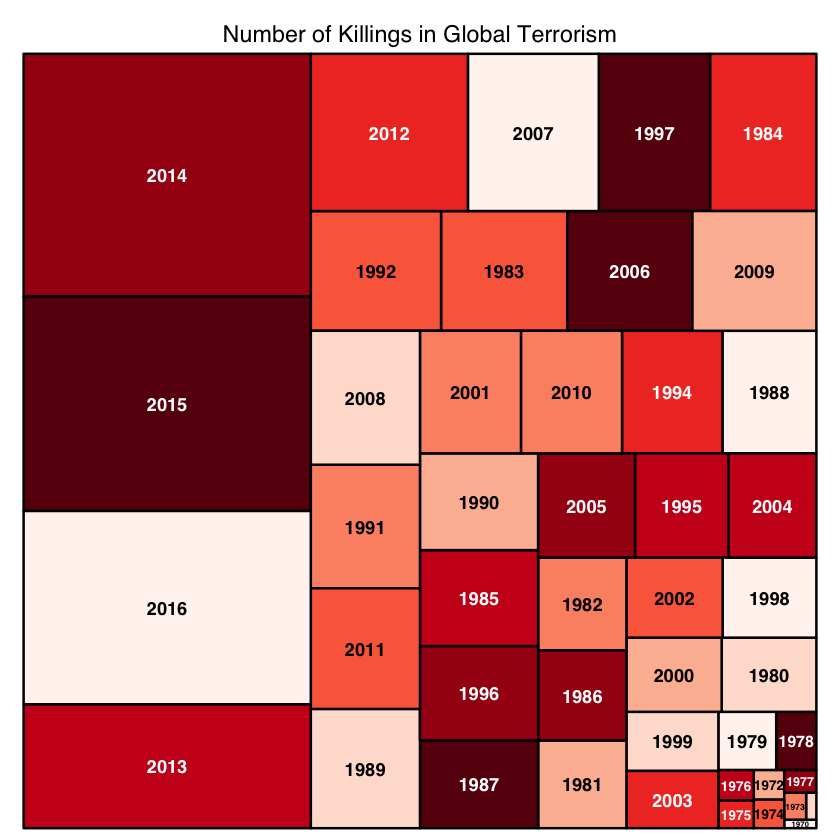

In [5]:
df %>%
filter(nkill > 0) %>%
treemap(
    index = c("iyear"),
    vSize = "nkill",
    palette = "Reds",
    title="Number of Killings in Global Terrorism",
    fontsize.title = 14
)

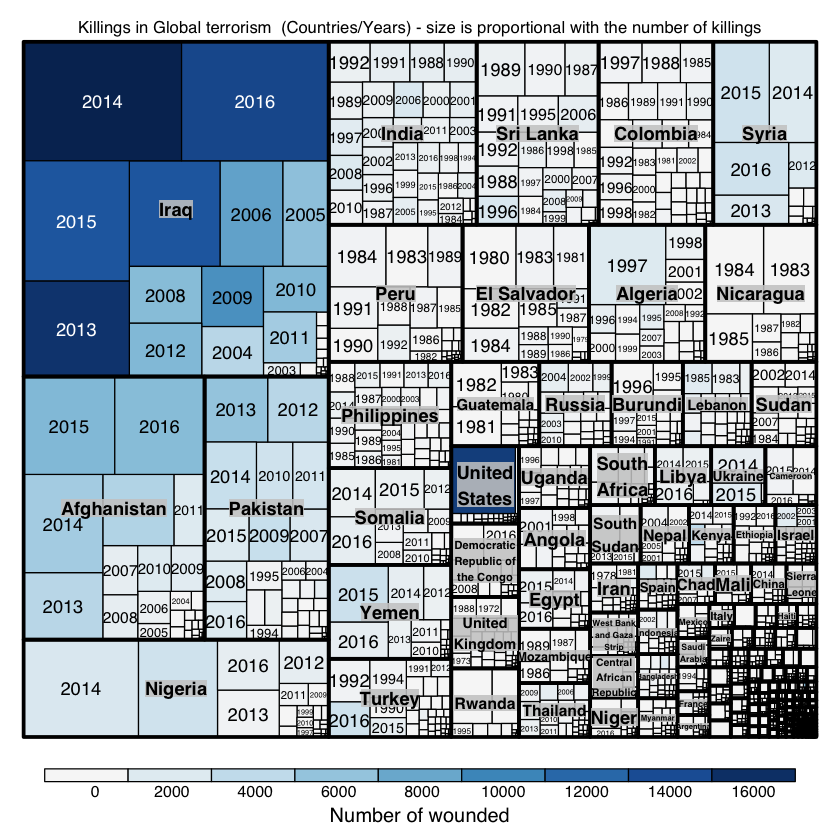

In [6]:
treemap(df,
        index=c("country_txt", "iyear"),  
        type = "value",
        vSize = "nkill", 
        vColor="nwound",
        palette = "RdBu", 
        title="Killings in Global terrorism  (Countries/Years) - size is proportional with the number of killings", 
        title.legend = "Number of wounded",
        fontsize.title = 10 
)

## **Number of terrorist perpetrators killed per year**

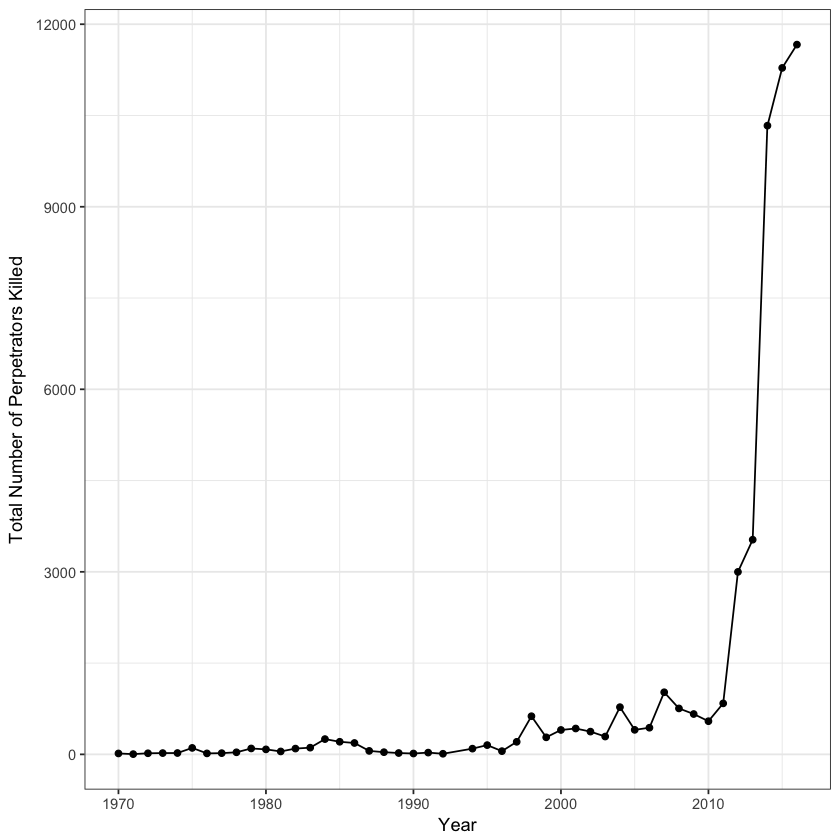

In [7]:
df %>%
group_by(iyear) %>%
summarise(total_kills = sum(nkillter, na.rm = TRUE)) %>%
ggplot(aes(iyear, total_kills))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of Perpetrators Killed")+
theme_bw()

Woah!!! There is a sudden jump in the perpetrators killed from 2010. This shows that the government agencies got better at killing them

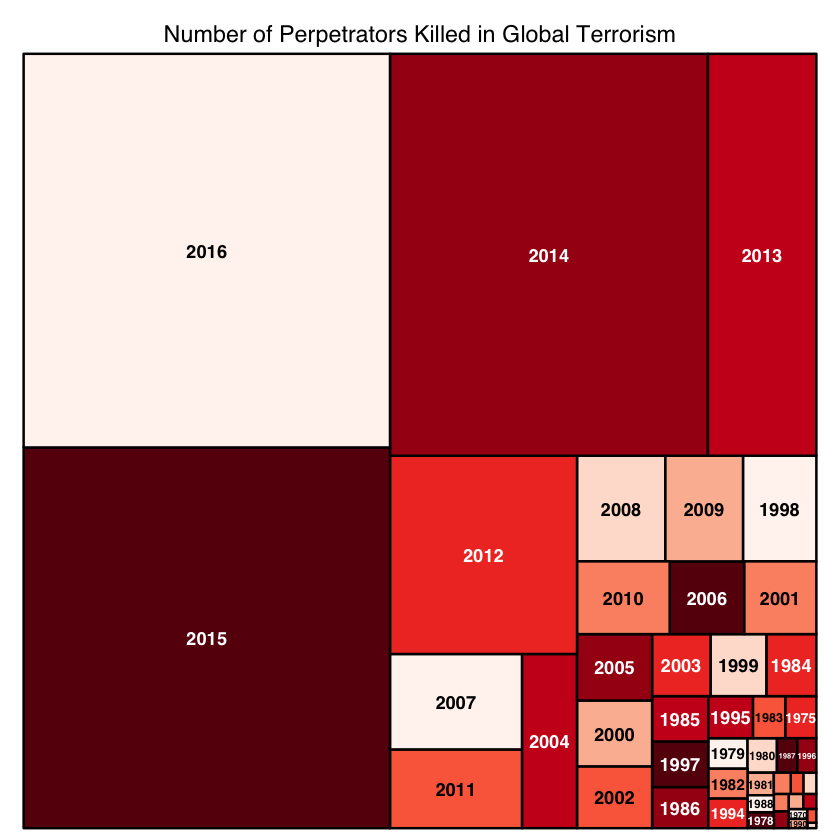

In [8]:
df %>%
filter(nkillter > 0) %>%
treemap(
    index = c("iyear"),
    vSize = "nkillter",
    palette = "Reds",
    title="Number of Perpetrators Killed in Global Terrorism",
    fontsize.title = 14
)

## **Number of people wounded per year**

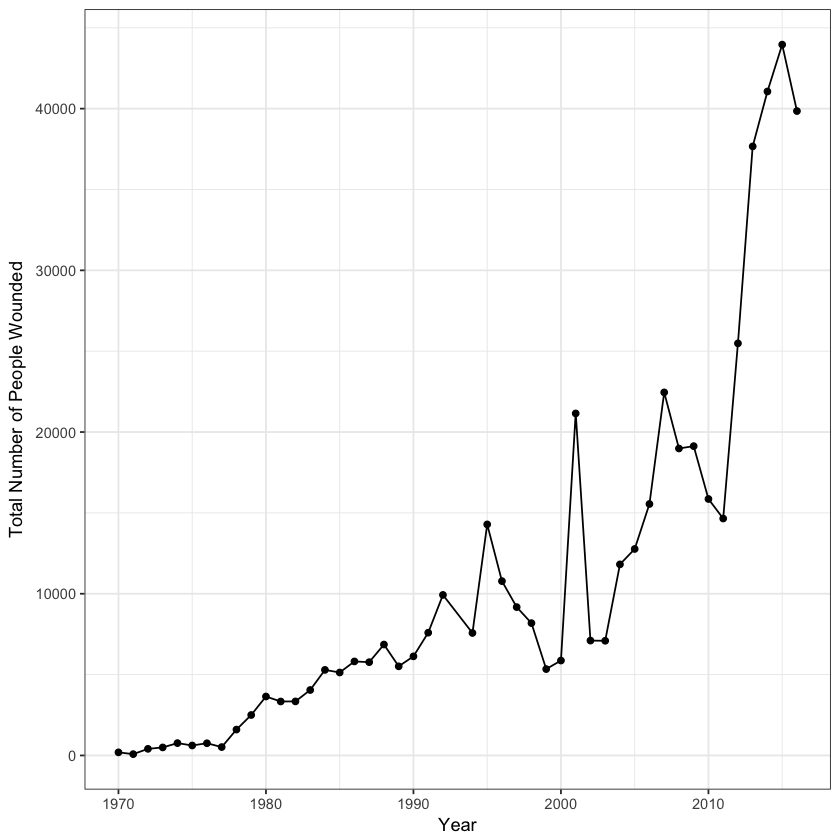

In [9]:
df %>%
group_by(iyear) %>%
summarise(total_wounded = sum(nwound, na.rm = TRUE)) %>%
ggplot(aes(iyear, total_wounded))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of People Wounded")+
theme_bw()

As above 2 patterns, the number of wounded have increased. However, there is a sharp increase in the number of wounded people just after year 2000. And then a sudden dip!

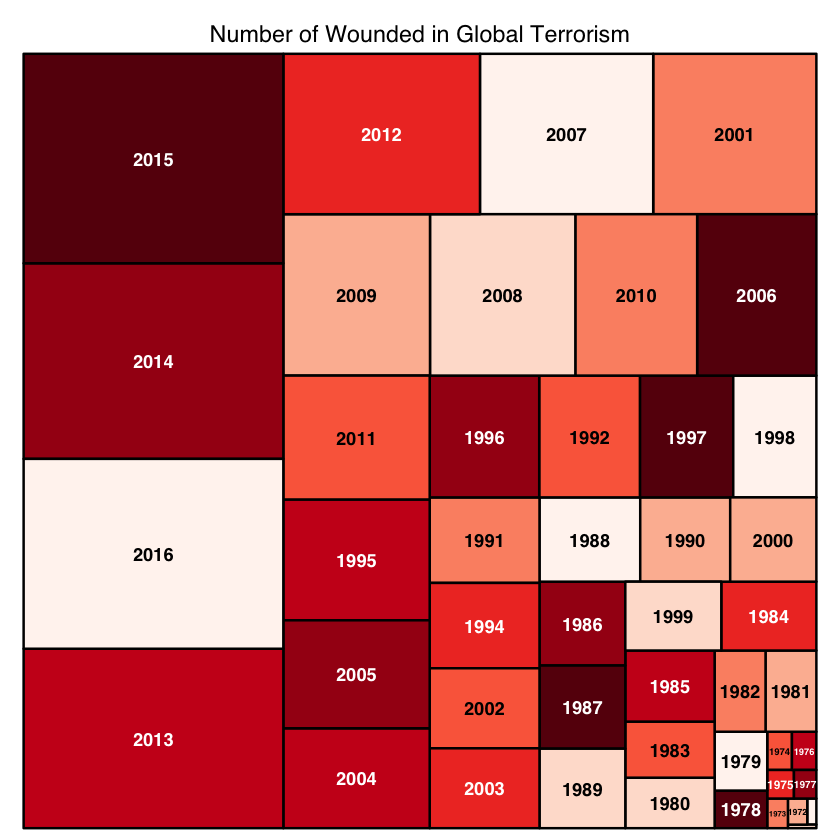

In [10]:
df %>%
filter(nwound > 0) %>%
treemap(
    index = c("iyear"),
    vSize = "nwound",
    palette = "Reds",
    title="Number of Wounded in Global Terrorism",
    fontsize.title = 14
)

## **Number of Americans killed per year**
Lets see how the US citizens have fared in the killings in terrorism

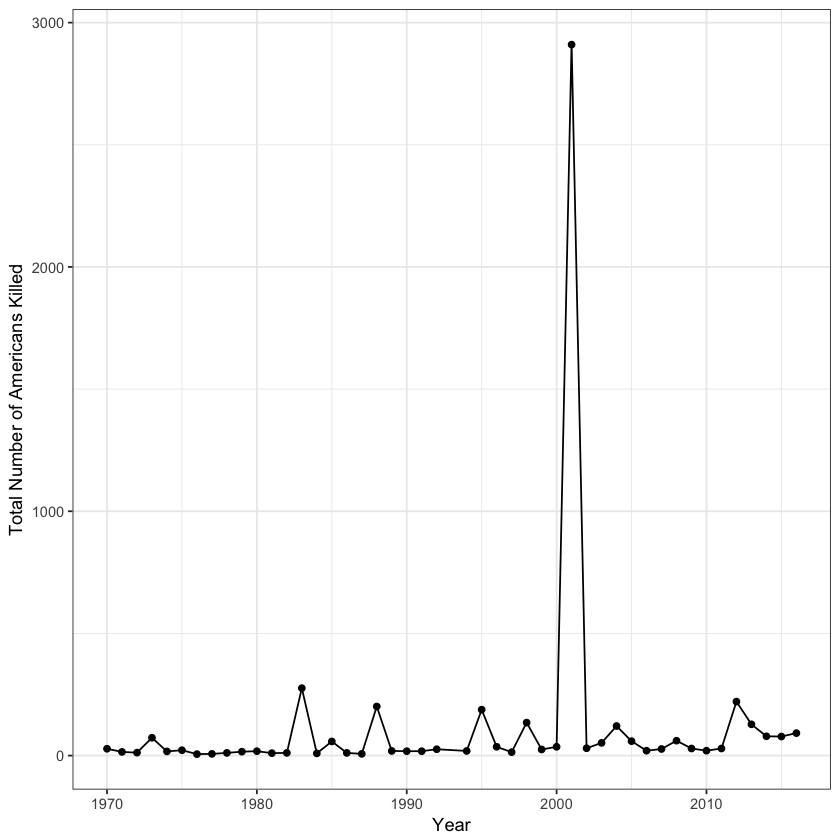

In [11]:
df %>%
group_by(iyear) %>%
summarise(total_us_killed = sum(nkillus, na.rm = TRUE)) %>%
ggplot(aes(iyear, total_us_killed))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of Americans Killed")+
theme_bw()

As expected, the highest number of Americans were killed in 2001 during the 9/11 attacks in the US.

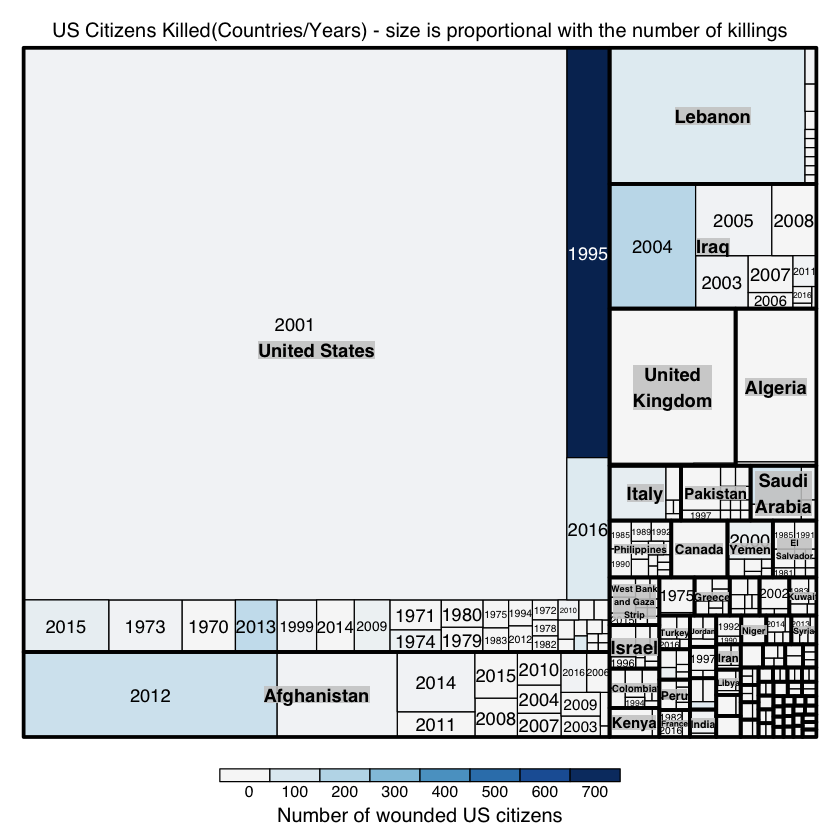

In [12]:
df %>%
filter(nkillus > 0) %>%
treemap(
        index = c("country_txt", "iyear"),  
        type = "value",
        vSize = "nkillus",  
        vColor = "nwoundus",
        palette = "RdBu",  
        title = "US Citizens Killed(Countries/Years) - size is proportional with the number of killings", 
        title.legend = "Number of wounded US citizens",
        fontsize.title = 12
)

In the above treemap, we see the number of Americans killed worldwide in different countries. Also, the color is proportional to the number of wounded Americans. We see that the higest number of wounded in the US was 700 during 1995. While the largest number of those killed was during 2001, again 9/11.

## **Number of Americans wounded per year**

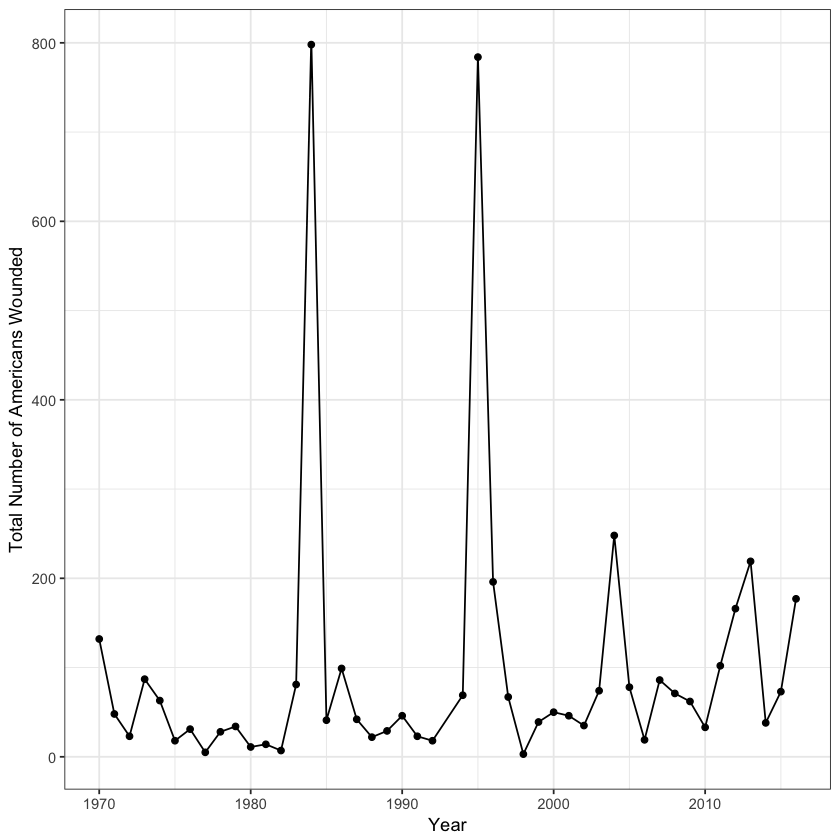

In [13]:
df %>%
group_by(iyear) %>%
summarise(total_us_wounded = sum(nwoundus, na.rm = TRUE)) %>%
ggplot(aes(iyear, total_us_wounded))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of Americans Wounded")+
theme_bw()

## **Value of property damage per year**
Now lets analyze how much property damage was caused during the years and what pattern does it follow.

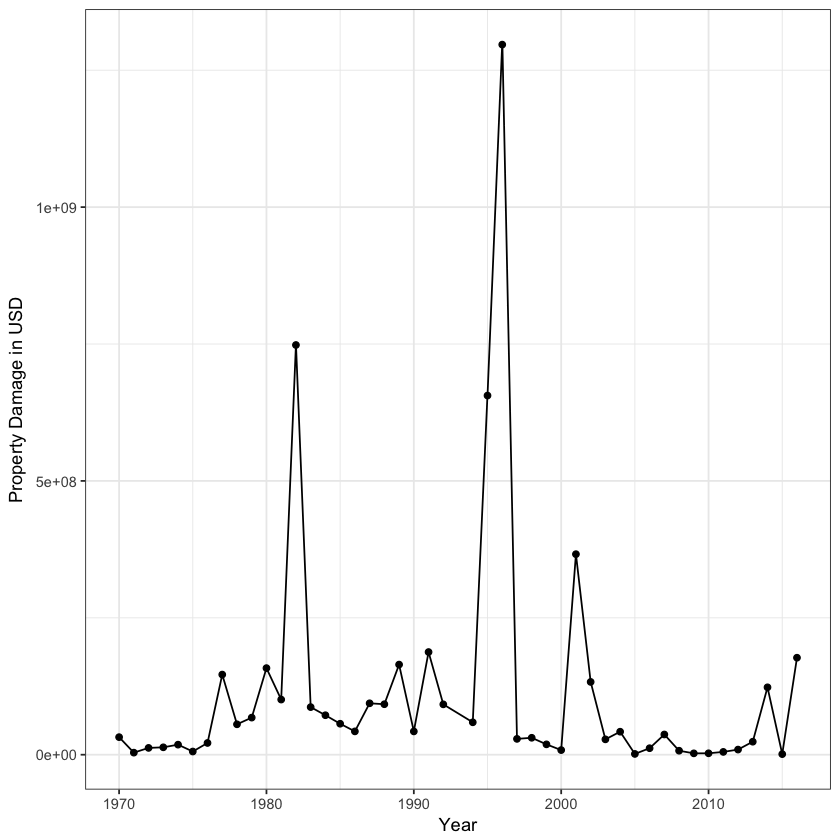

In [14]:
df %>%
group_by(iyear) %>%
summarise(
    total_property_damamge_in_dollars = sum(propvalue, na.rm = TRUE)
) %>%
ggplot(aes(iyear, total_property_damamge_in_dollars))+
xlab("Year")+
ylab("Property Damage in USD")+
geom_line()+
geom_point()+
theme_bw()

Hmmm...there seems to be a huge spike in the property damage between 1990 and 2000. And then there it again goes down. We find out the year and see what might have happened in that year 

In [15]:
df %>%
group_by(iyear) %>%
summarise(
    total_property_damamge_in_dollars = sum(propvalue, na.rm = TRUE)
) %>%
filter(total_property_damamge_in_dollars > 1e9)

iyear,total_property_damamge_in_dollars
1996,1296774701


Something big might have happened in the year 1996 to account for such huge loss in property.

## **Extent of property damage over the years**

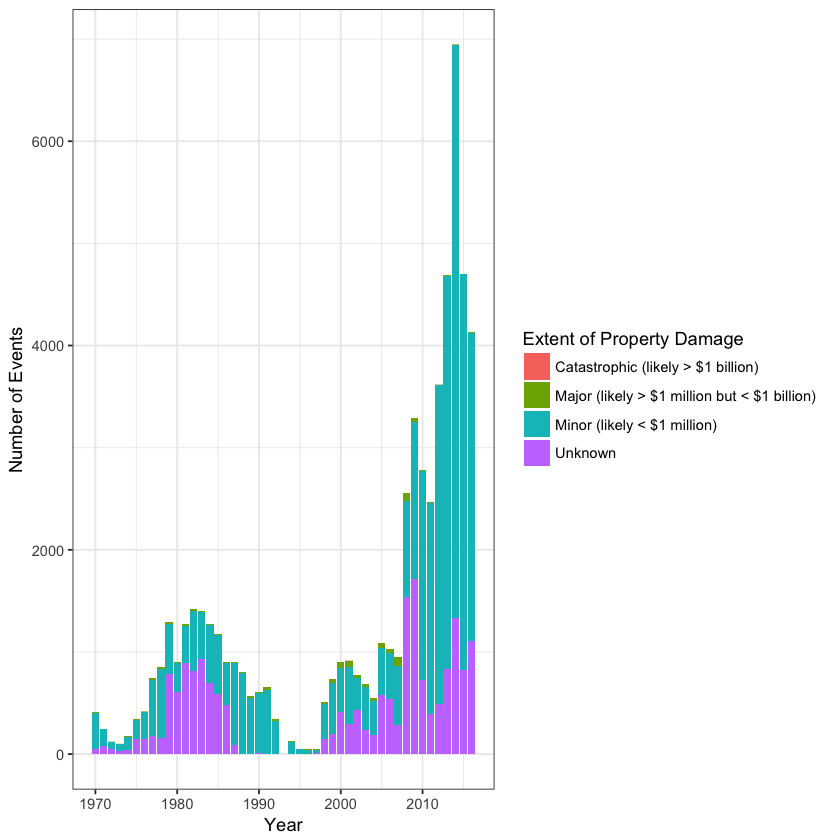

In [16]:
df %>%
filter(!is.na(propextent_txt)) %>%
group_by(iyear, propextent_txt) %>%
summarise(
    number_of_events = length(iyear)
) %>%
ggplot(aes(iyear, number_of_events, fill = propextent_txt))+
geom_bar(stat = "identity")+
theme_bw()+
guides(fill = guide_legend(title = "Extent of Property Damage"))+
xlab("Year")+
ylab("Number of Events")

## **Number of people killed in various regions**
Now lets see how the number of people killed fared in each region

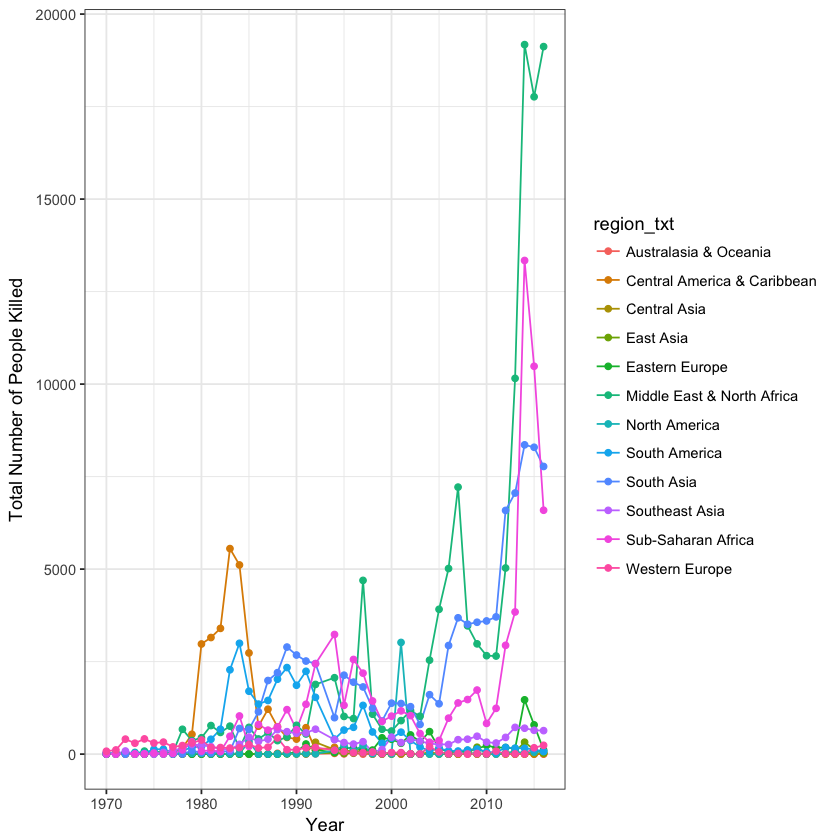

In [17]:
df %>%
group_by(iyear, region_txt) %>%
summarise(
    total_kills = sum(nkill, na.rm = TRUE),
) %>%
ungroup() %>%
ggplot(aes(iyear, total_kills, color = region_txt))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of People Killed")+
theme_bw()

We see that Middle East and North Africa has the highest number of people who are killed. As opposed to that, Australia and Oceania have the least number of people killed

## **Number of people wounded in various regions**

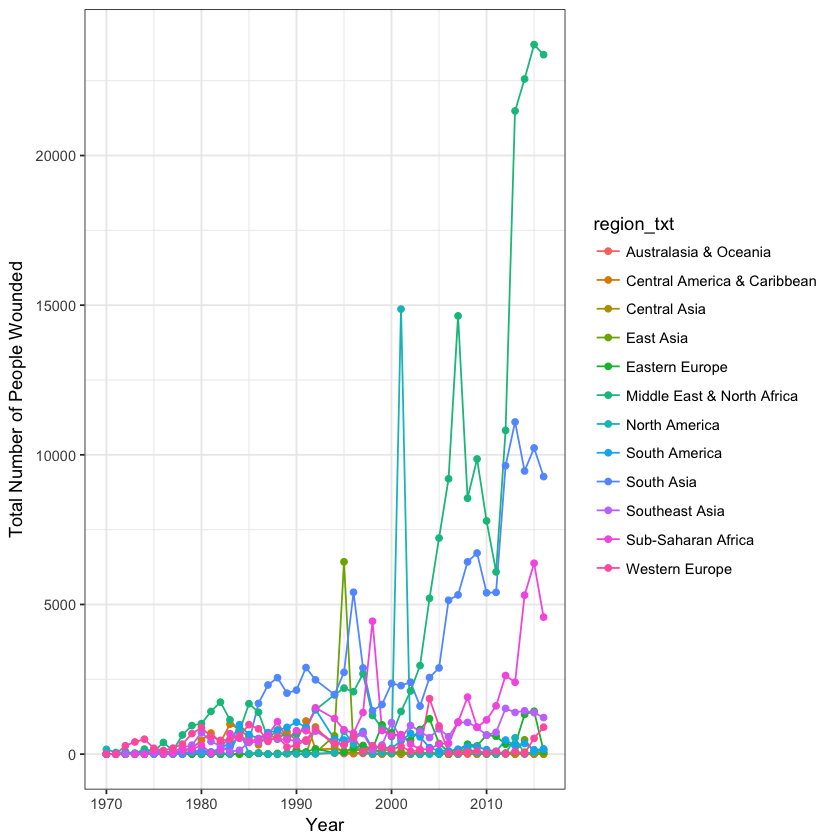

In [18]:
df %>%
group_by(iyear, region_txt) %>%
summarise(
    total_wounded = sum(nwound, na.rm = TRUE),
) %>%
ungroup() %>%
ggplot(aes(iyear, total_wounded, color = region_txt))+
geom_line()+
geom_point()+
xlab("Year")+
ylab("Total Number of People Wounded")+
theme_bw()

Again the number of people wounded is high in Middle East and North Africa. Also, there was a spike in North America during 2001 due to 9/11 attacks

## **Types of attacks**
Lets look at the types of attack and their count and how they fared over the years

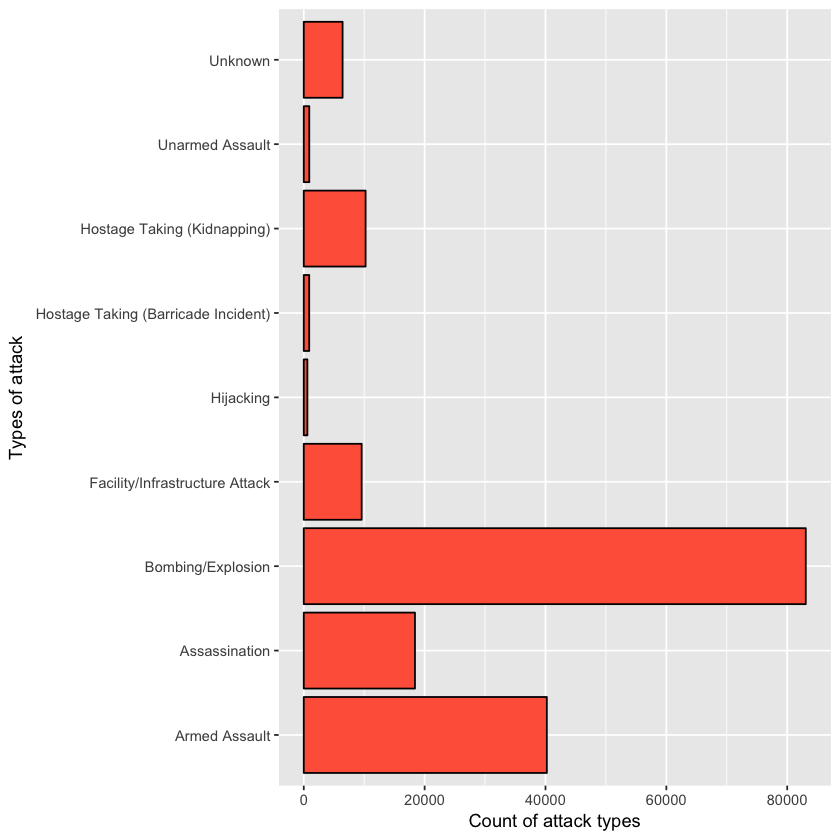

In [19]:
df %>%
filter(!is.na(attacktype1_txt)) %>%
ggplot(aes(attacktype1_txt))+
geom_bar(fill = "tomato", color = "black")+
xlab("Types of attack")+
ylab("Count of attack types")+
coord_flip()

We see that the most preferred method is Bombing/Explosion followed by Armed Assault

## **Types of attack over the years**


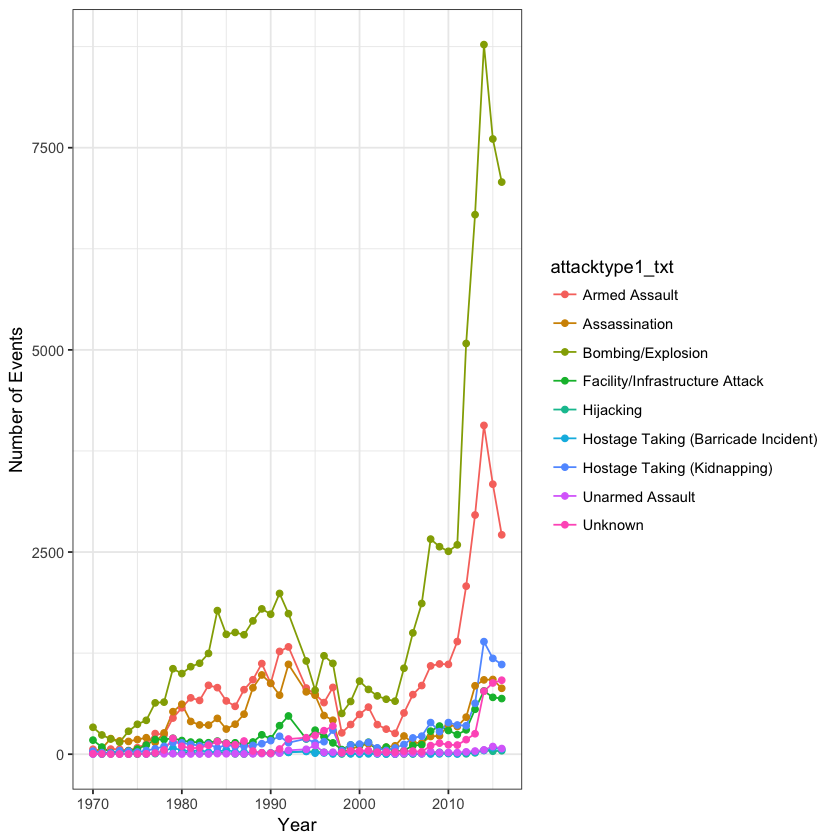

In [20]:
df %>%
group_by(iyear, attacktype1_txt) %>%
summarise(
    number_of_events = length(iyear)
) %>%
ggplot(aes(iyear, number_of_events, color = attacktype1_txt))+
geom_line()+
geom_point()+
theme_bw()+
guides(fill = guide_legend(title = "Types of Attack"))+
xlab("Year")+
ylab("Number of Events")

Bombing followed by armed assault are the most used methods. And the frequency of events involving these 2 have increased over the years!

## **Number of People killed by various attacks**

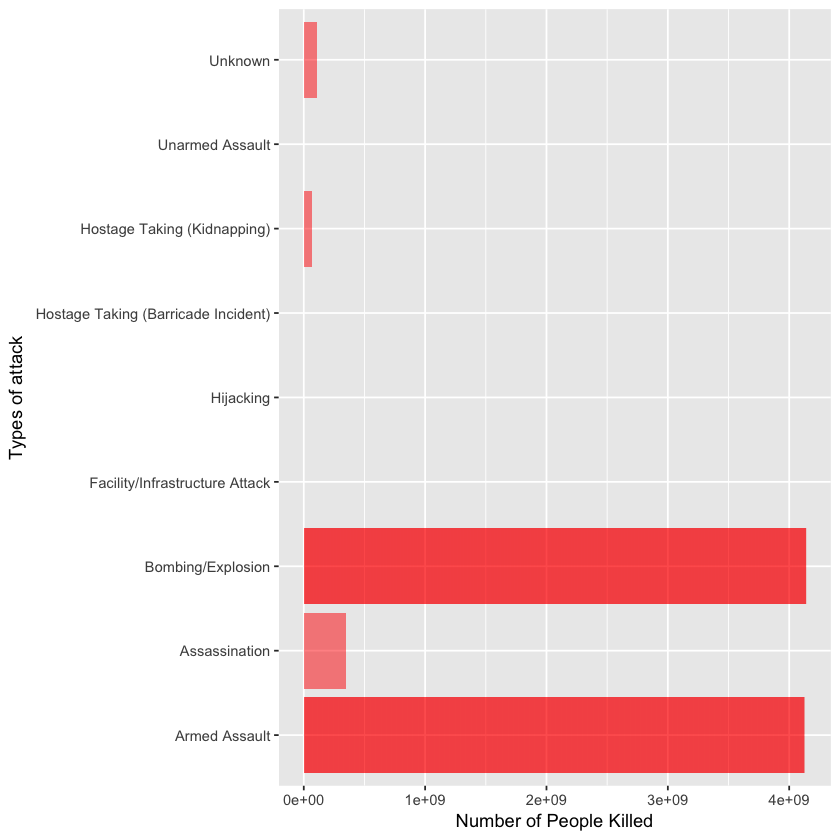

In [21]:
df %>%
filter(!is.na(attacktype1_txt) & nkill > 0) %>%
group_by(attacktype1_txt) %>%
mutate(
    number_of_people_killed = sum(nkill, na.rm = TRUE),
) %>%
ggplot(aes(attacktype1_txt, number_of_people_killed))+
geom_bar(stat = "identity", alpha = 1/2, fill = "red")+
xlab("Types of attack")+
ylab("Number of People Killed")+
coord_flip()

The highest number of people are killed by bombing and armed assault. Even though armed assault is less than bombing in terms of count, both kill approximately the same number of people

## **Number of people wounded in various attacks**

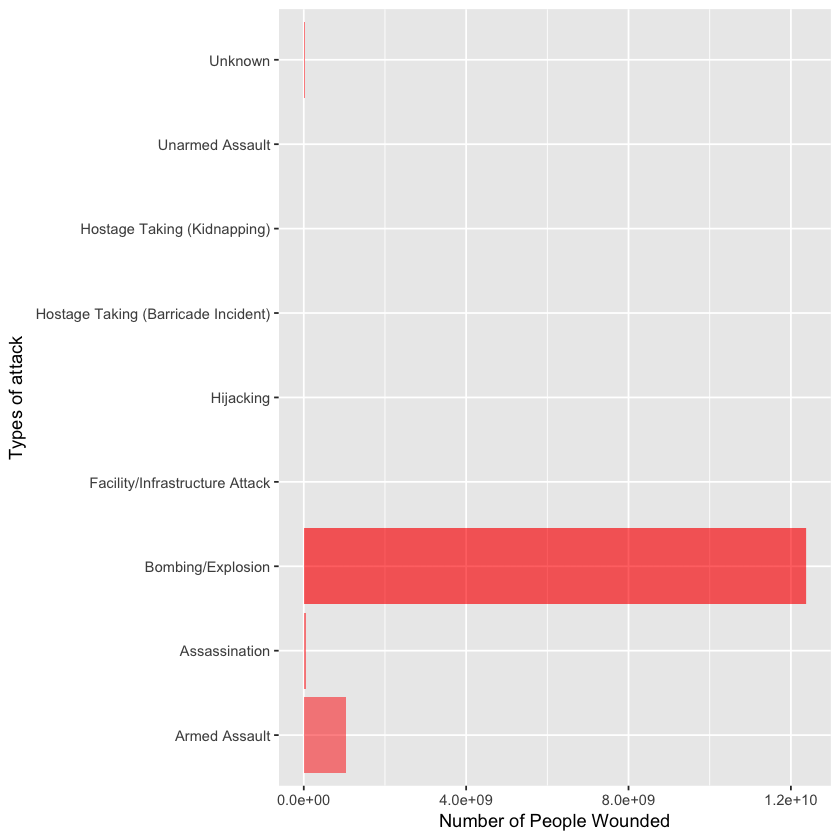

In [22]:
df %>%
filter(!is.na(attacktype1_txt) & nwound > 0) %>%
group_by(attacktype1_txt) %>%
mutate(
    number_of_people_wounded = sum(nwound, na.rm = TRUE),
) %>%
ggplot(aes(attacktype1_txt, number_of_people_wounded))+
geom_bar(stat = "identity", alpha = 1/2, fill = "red")+
xlab("Types of attack")+
ylab("Number of People Wounded")+
coord_flip()

Bombing wounds and kills a lot of people. Armed assault results in little wounding.

## **Number of Americans wounded and killed by various attacks**
Lets see how our dear Americans fared and what types of attack they face.

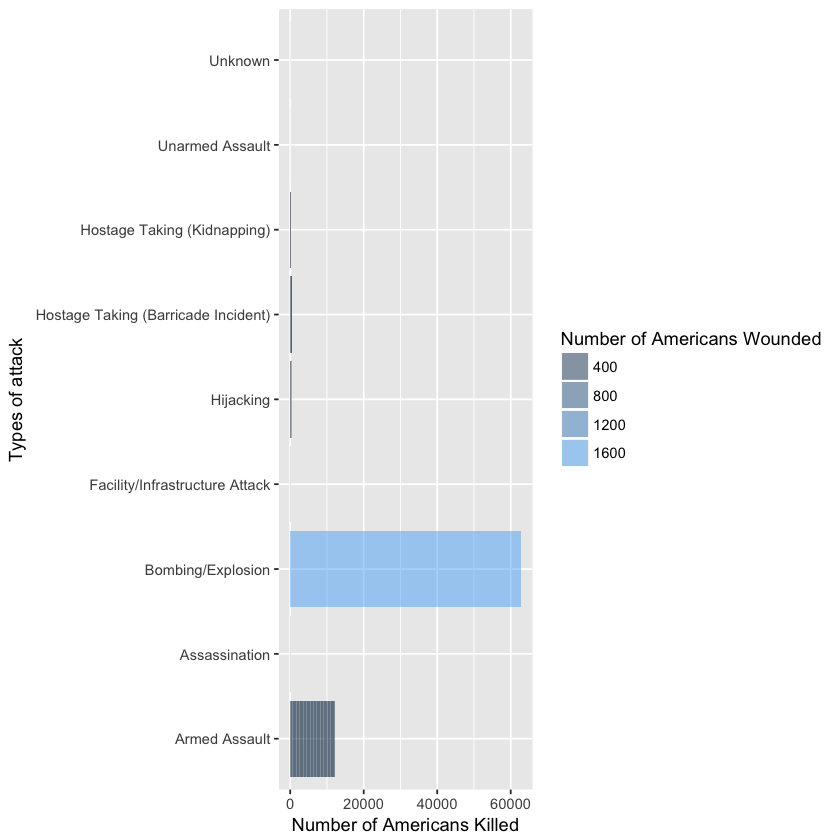

In [23]:
df %>%
filter(!is.na(attacktype1_txt) & nkillus > 0 & nwoundus > 0) %>%
group_by(attacktype1_txt) %>%
mutate(
    number_of_americans_killed = sum(nkillus, na.rm = TRUE),
    number_of_americans_wounded = sum(nwoundus, na.rm = TRUE)
) %>%
ggplot(aes(attacktype1_txt, number_of_americans_killed))+
geom_bar(aes(fill = number_of_americans_wounded), stat = "identity", alpha = 1/2)+
guides(fill = guide_legend(title = "Number of Americans Wounded"))+
xlab("Types of attack")+
ylab("Number of Americans Killed")+
coord_flip()

It seems that Americans are killed the most by bombing and explosions followed by armed assault.

## **Number of people killed across various regions and attacks**

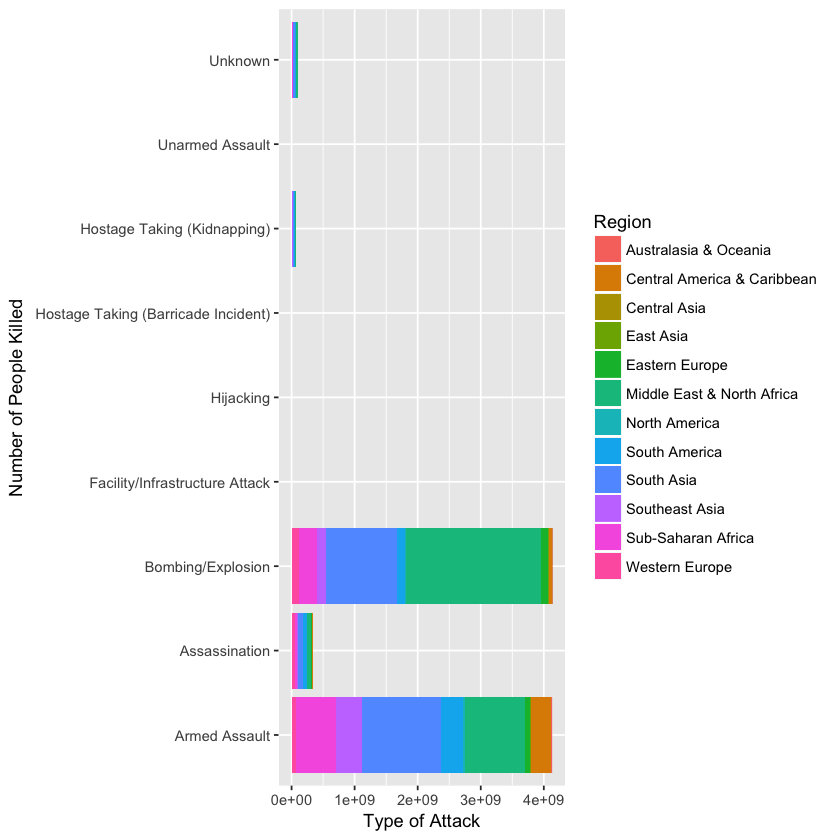

In [24]:
df %>%
filter(!is.na(attacktype1_txt) & nkill > 0) %>%
group_by(attacktype1_txt) %>%
mutate(
    number_of_people_killed = sum(nkill, na.rm = TRUE),
) %>%
ggplot(aes(attacktype1_txt, number_of_people_killed))+
geom_bar(aes(fill = region_txt), stat = "identity")+
guides(fill = guide_legend(title = "Region"))+
xlab("Number of People Killed")+
ylab("Type of Attack")+
coord_flip()

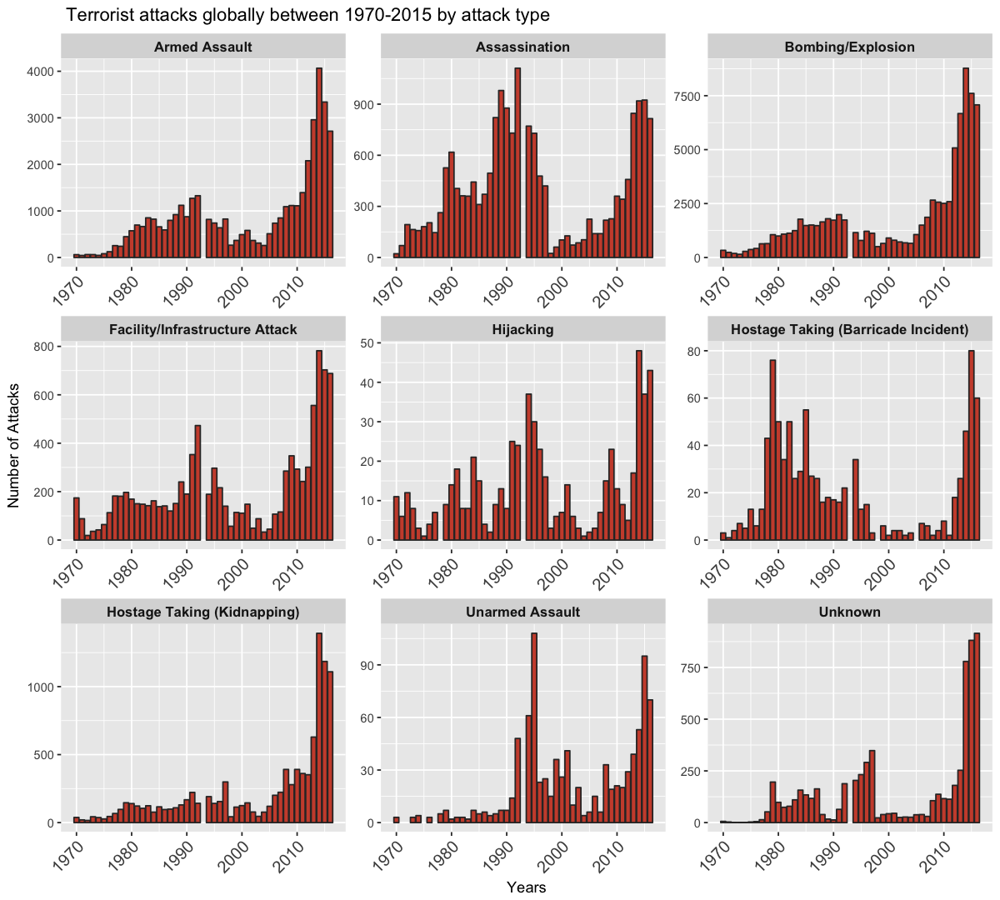

In [111]:
ggplot(df, aes(x = iyear))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~attacktype1_txt, scales = "free", ncol = 3)+ 
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 10, face = "bold"))+
labs(title =" Terrorist attacks globally between 1970-2015 by attack type", x = "Years", y = "Number of Attacks", size = 15)

## **Analysis of attack types in India**

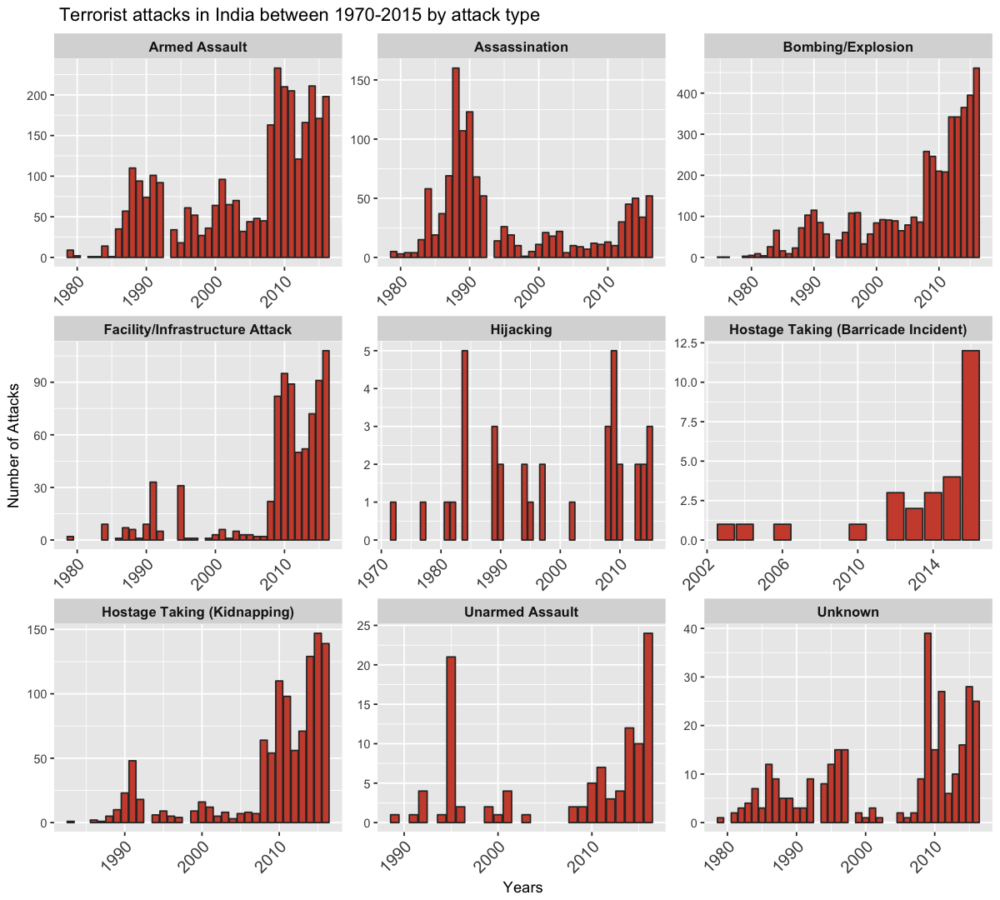

In [112]:
df %>%
filter(country_txt == "India") %>%
ggplot(aes(x = iyear))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~attacktype1_txt, scales = "free", ncol = 3)+ 
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 10, face = "bold"))+
labs(title =" Terrorist attacks in India between 1970-2015 by attack type", x = "Years", y = "Number of Attacks", size = 15)

## **Analysis of attack types in USA**

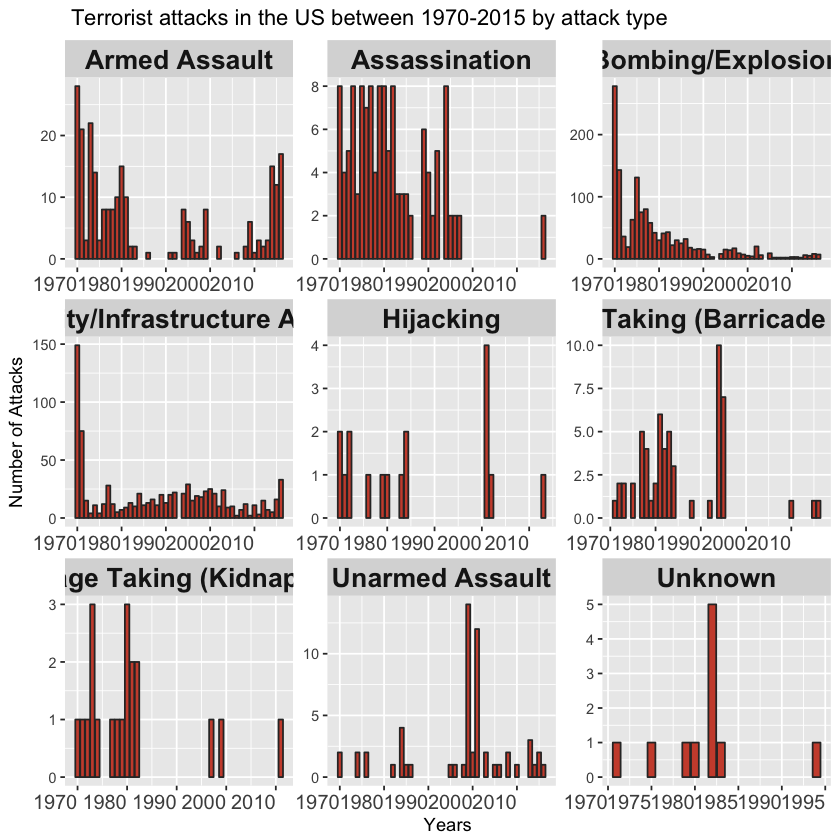

In [27]:
df %>%
filter(country_txt == "United States") %>%
ggplot(aes(x = iyear))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~attacktype1_txt, scales = "free", ncol = 3)+ 
theme(axis.text.x = element_text(hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))+
labs(title =" Terrorist attacks in the US between 1970-2015 by attack type", x = "Years", y = "Number of Attacks", size = 15)

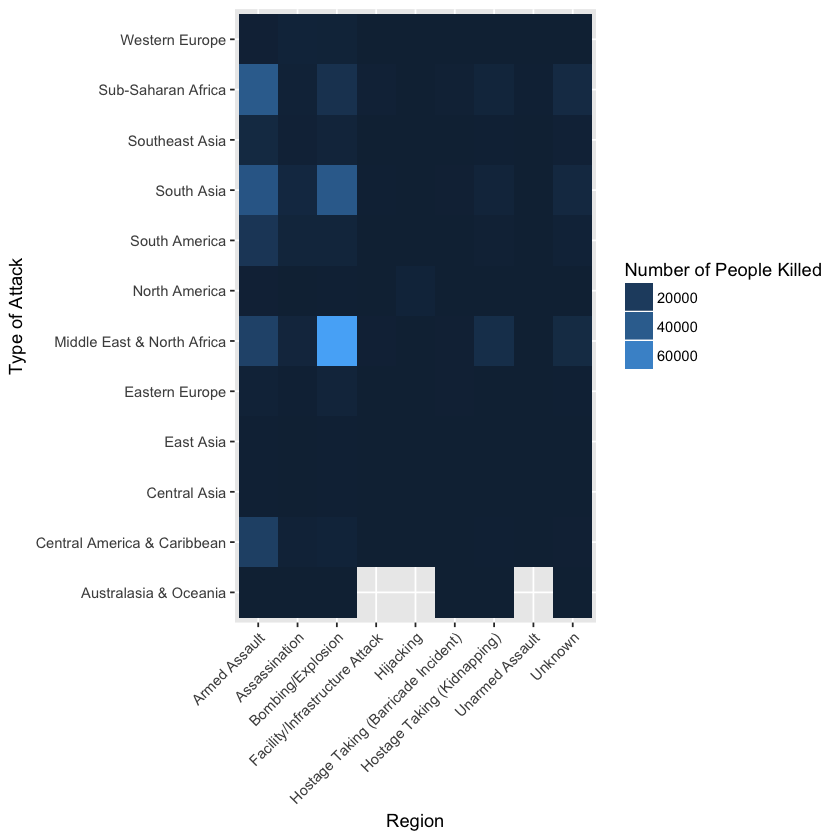

In [28]:
df %>%
filter(!is.na(attacktype1_txt) & nkill > 0) %>%
group_by(region_txt, attacktype1_txt) %>%
summarise(
    number_of_people_killed = sum(nkill, na.rm = TRUE),
) %>%
ggplot(aes(region_txt, attacktype1_txt))+
geom_tile(aes(fill = number_of_people_killed))+
guides(fill = guide_legend(title = "Number of People Killed"))+
xlab("Type of Attack")+
ylab("Region")+
coord_flip()+
theme(axis.text.x = element_text(angle = 45, hjust = 1))

Middle East and North Africa is the most plagued by bombing and explosion. The Sub-Saharan Africa has Armed Assault as its most preferred method.

## **Number of hostages kidnapped in various years**

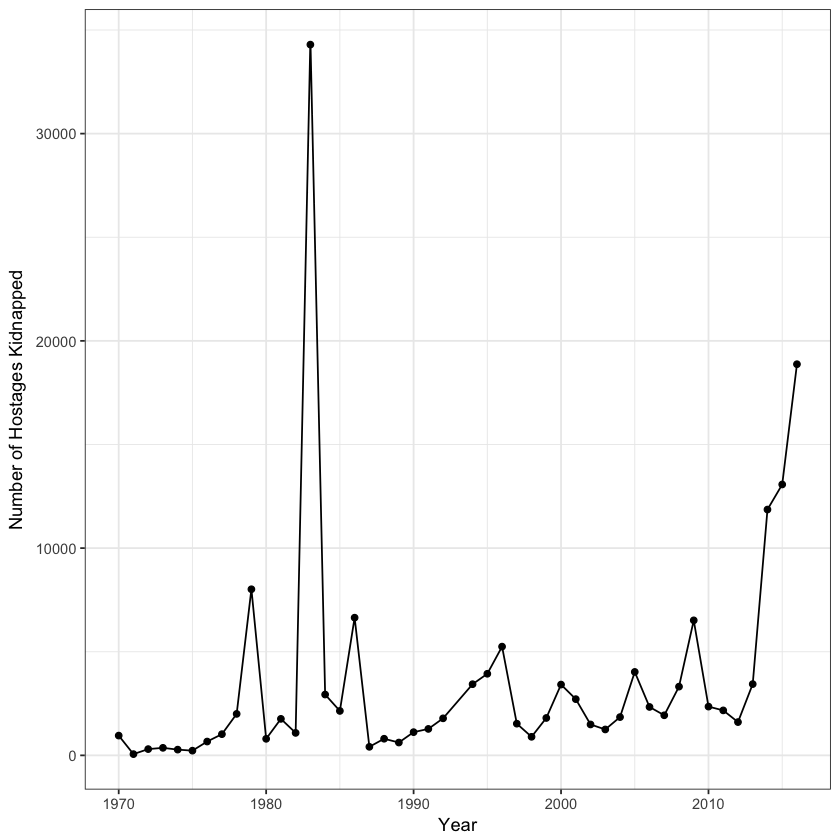

In [29]:
df %>%
filter(nhostkid >= 0) %>%
group_by(iyear) %>%
summarise(
    number_of_hostages_kidnapped = sum(nhostkid, na.rm = TRUE)
) %>%
ggplot(aes(iyear, number_of_hostages_kidnapped))+
geom_line()+
geom_point()+
theme_bw()+
xlab("Year")+
ylab("Number of Hostages Kidnapped")

In [30]:
df %>%
filter(nhostkid >= 0) %>%
group_by(iyear) %>%
summarise(
    number_of_hostages_kidnapped = sum(nhostkid, na.rm = TRUE)
) %>%
filter(number_of_hostages_kidnapped > 30000)

iyear,number_of_hostages_kidnapped
1983,34295


There is a huge spike in the number of hostages kidnapped in 1983. This might be related to the Lenanese Civil War during which lot of hostages were kidnapped. We will see how the number of hostages kidnapped vary across countries and regions.

## **Number of Americans kidnapped**

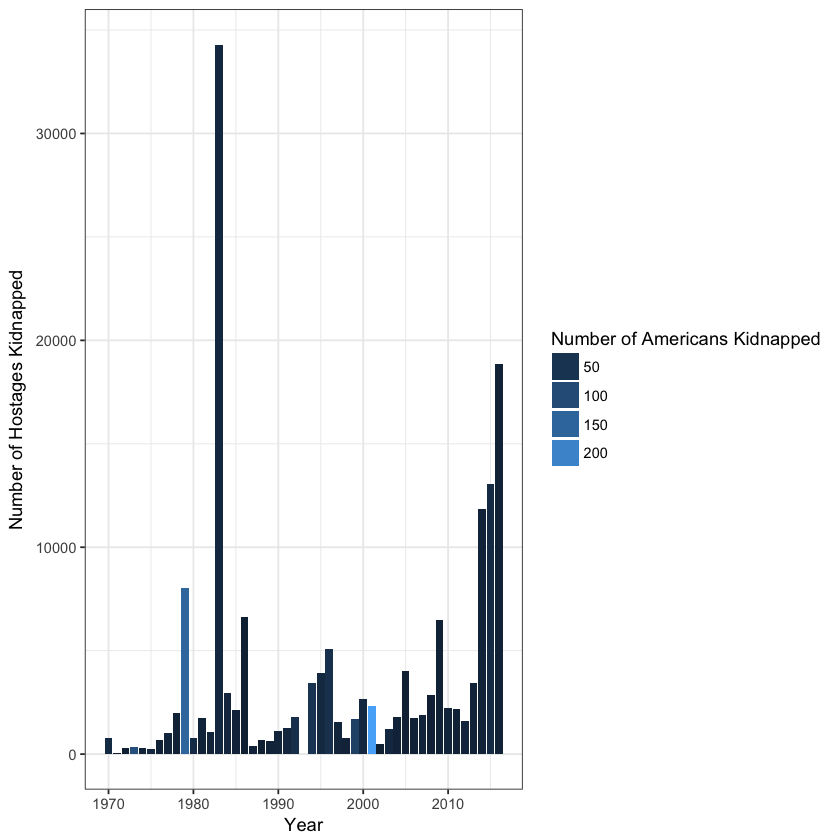

In [31]:
df %>%
filter(nhostkid >= 0 & nhostkidus >= 0) %>%
group_by(iyear) %>%
summarise(
    number_of_hostages_kidnapped = sum(nhostkid, na.rm = TRUE),
    number_of_americans_kidnapped = sum(nhostkidus, na.rm = TRUE)
) %>%
ggplot(aes(iyear, number_of_hostages_kidnapped))+
geom_bar(aes(fill = number_of_americans_kidnapped), stat = "identity")+
theme_bw()+
xlab("Year")+
ylab("Number of Hostages Kidnapped")+
guides(fill = guide_legend(title = "Number of Americans Kidnapped"))

Very few americans are involved in kidnappings around the world, but the highest number was during 2001 because of the 9/11. During that year the number of people kidnapped was low but the number of americans kidnapped was high

## **Number of people kidnapped in various regions**

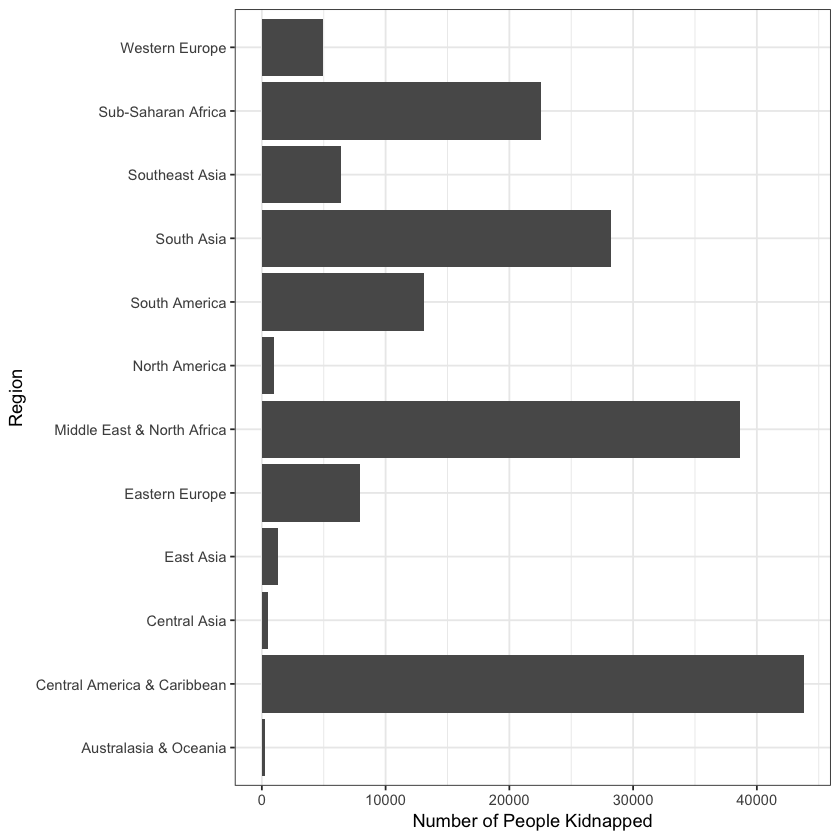

In [32]:
df %>%
filter(nhostkid >= 0) %>%
group_by(region_txt) %>%
summarise(
    num_people_kidnapped = sum(nhostkid, na.rm = TRUE)
) %>%
ggplot(aes(region_txt, num_people_kidnapped))+
geom_bar(stat = "identity")+
theme_bw()+
xlab("Region")+
ylab("Number of People Kidnapped")+
coord_flip()

## **Ransom amount demanded in various regions**
Lets see how much money was demanded in various countries

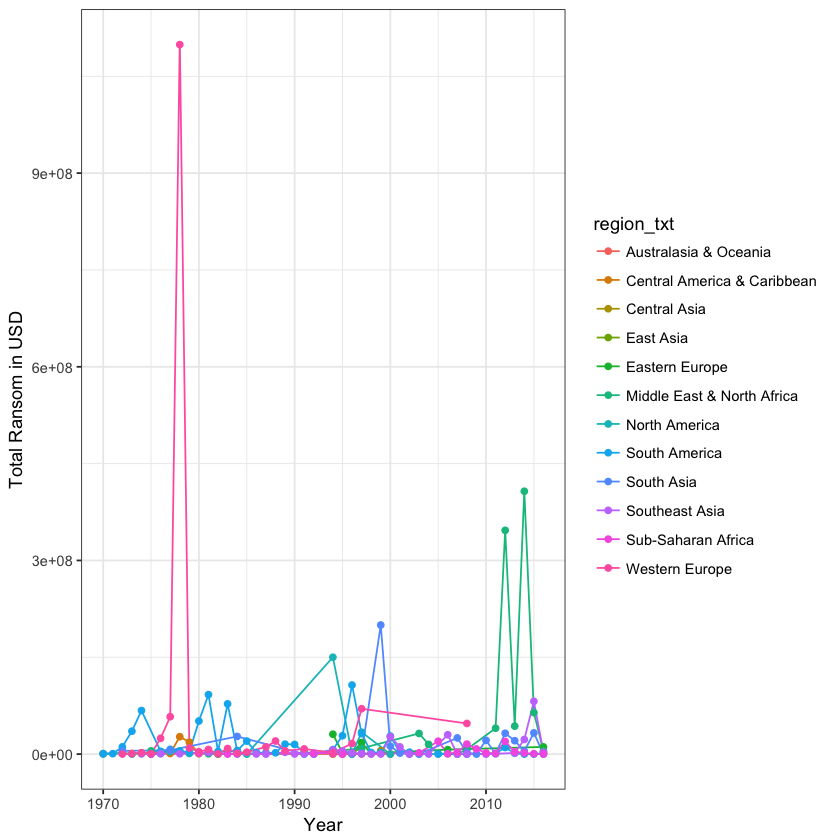

In [33]:
df %>%
group_by(region_txt, iyear) %>%
summarise(
    total_ransom_demanded = sum(ransomamt, na.rm = TRUE)
) %>%
filter(total_ransom_demanded > 0) %>%
ggplot(aes(iyear, total_ransom_demanded, color = region_txt))+
geom_line()+
geom_point()+
theme_bw()+
xlab("Year")+
ylab("Total Ransom in USD")

In [34]:
df %>%
group_by(region_txt, iyear) %>%
summarise(
    total_ransom_demanded = sum(ransomamt, na.rm = TRUE)
) %>%
filter(total_ransom_demanded > 0) %>%
filter(total_ransom_demanded > 9e8)

region_txt,iyear,total_ransom_demanded
Western Europe,1978,1099087000


So we observe that there is HUGE! spike in the amount of ransom demanded in Western Europe in the year 1978. This may be related to the incident where Charlie Chaplin's body was stolen and a huge ransom was demanded.

## **Ransom amount and paid demanded in various countries**

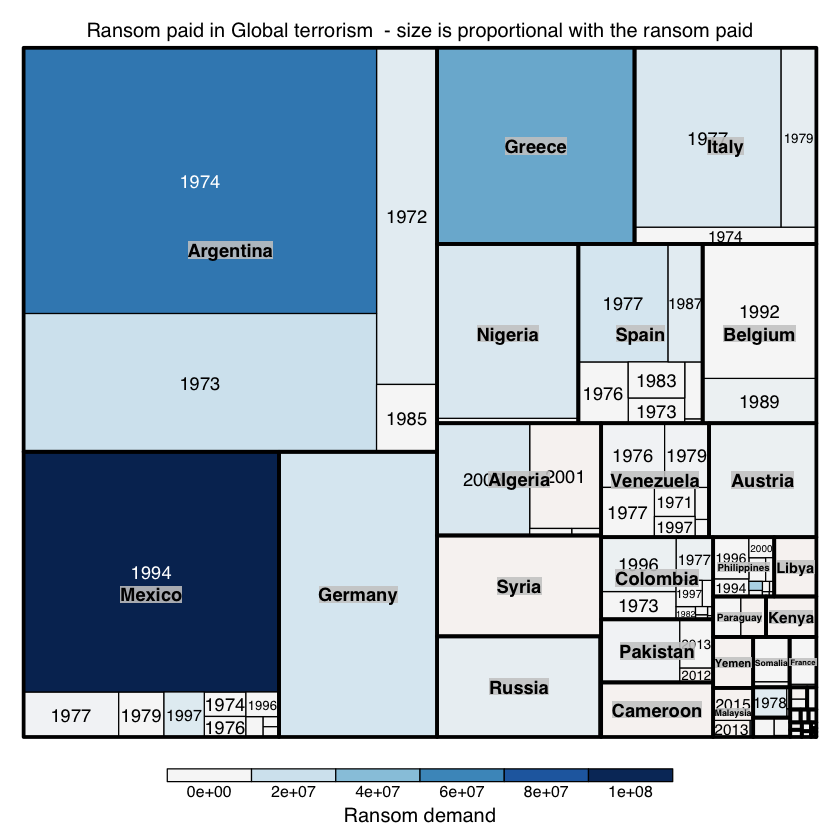

In [35]:
df %>%
filter(ransompaid > 0) %>%
treemap(index = c("country_txt", "iyear"), 
        type = "value",
        vSize = "ransompaid", 
        vColor="ransomamt",
        palette = "RdBu",  
        title="Ransom paid in Global terrorism  - size is proportional with the ransom paid", 
        title.legend = "Ransom demand",
        fontsize.title = 12
)

## **Outcome of hostage/kidnapping events**

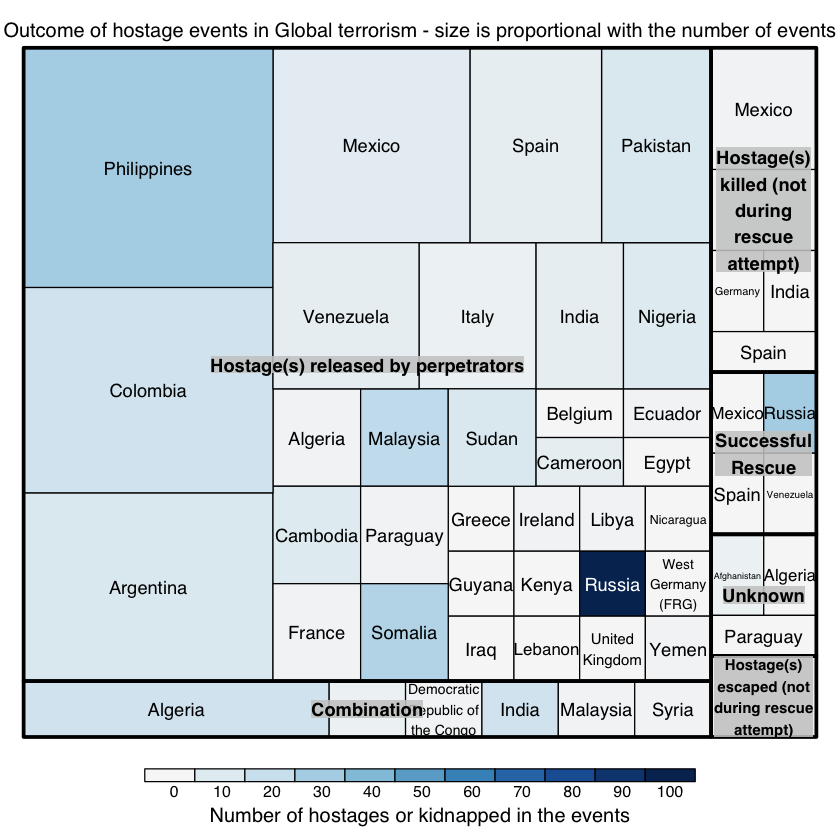

In [36]:
df %>%
filter(ransompaid > 0 & nhostkid > 0) %>%
group_by(hostkidoutcome_txt,country_txt) %>%
summarise(
    number_of_hostages_kidnapped = sum(nhostkid, na.rm = TRUE),
    count = n()
) %>%
treemap(index=c("hostkidoutcome_txt","country_txt"),  
        type = "value",
        vSize = "count",  
        vColor="number_of_hostages_kidnapped",
        palette = "RdBu",  
        title="Outcome of hostage events in Global terrorism - size is proportional with the number of events", 
        title.legend = "Number of hostages or kidnapped in the events",
        fontsize.title = 12 
       )

## **Type of weapons used**

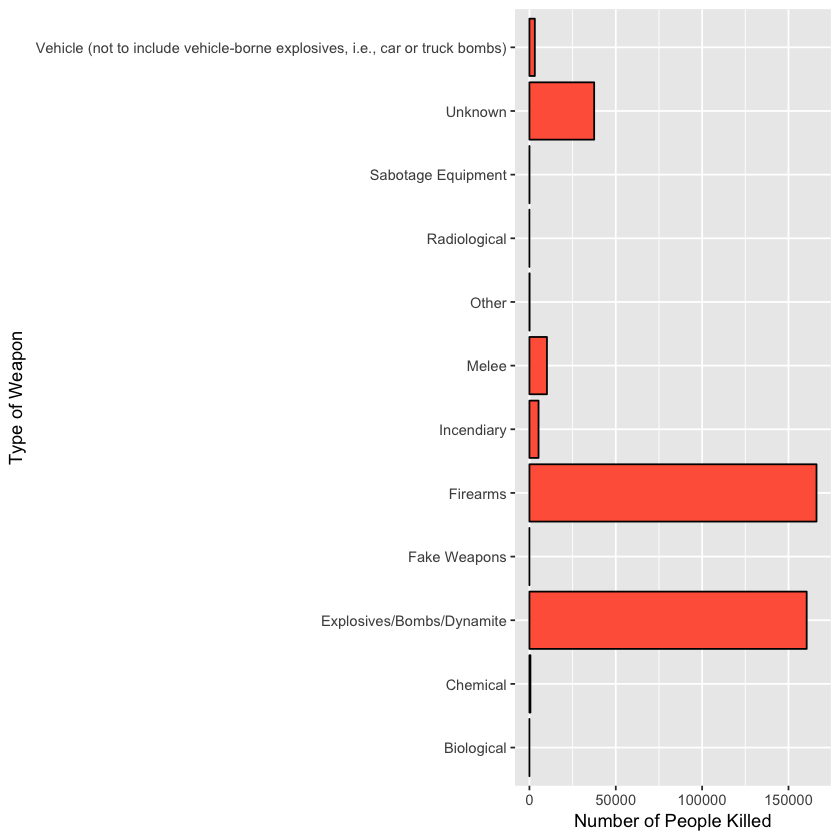

In [37]:
df %>%
group_by(weaptype1_txt) %>%
summarise(
    people_killed_by_weapon = sum(nkill, na.rm = TRUE)
) %>%
ggplot(aes(weaptype1_txt, people_killed_by_weapon))+
geom_bar(stat = "identity", fill = "tomato", color = "black")+
coord_flip()+
ylab("Number of People Killed")+
xlab("Type of Weapon")

We see that most number of people are killed by firearms followed by bombs.

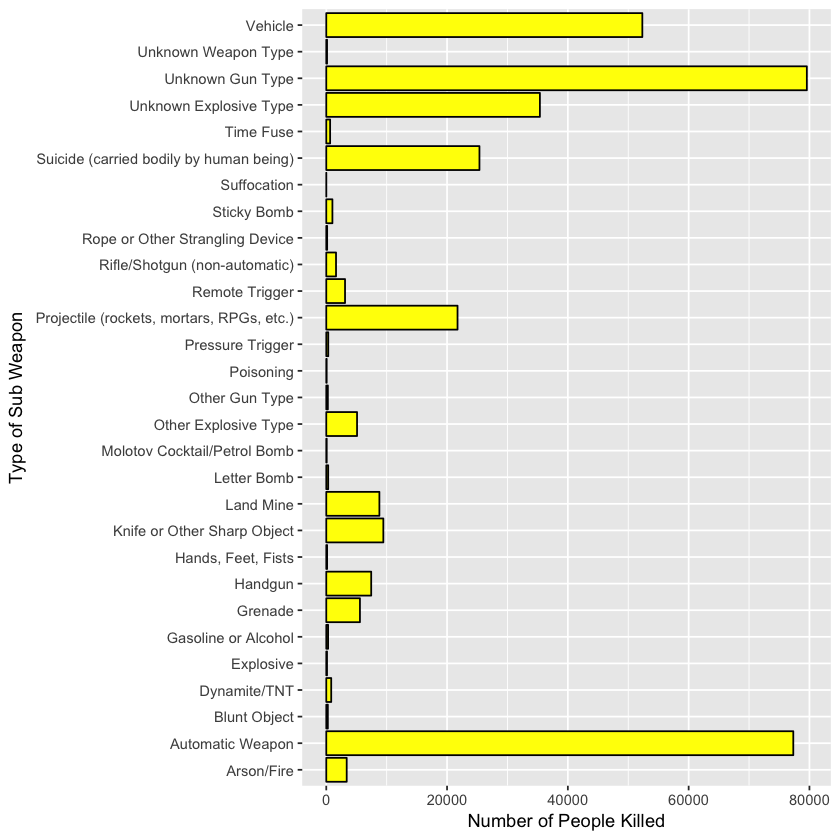

In [38]:
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
group_by(weapsubtype1_txt) %>%
summarise(
    people_killed_by_weapon = sum(nkill, na.rm = TRUE)
) %>%
ggplot(aes(weapsubtype1_txt, people_killed_by_weapon))+
geom_bar(stat = "identity", fill = "yellow", color = "black")+
coord_flip()+
ylab("Number of People Killed")+
xlab("Type of Sub Weapon")

This reveals an interesting thing: people are killed a lot by vehicles! The most of them are killed by Automatic Weapons!

## **Number of Americans killed by weapons**

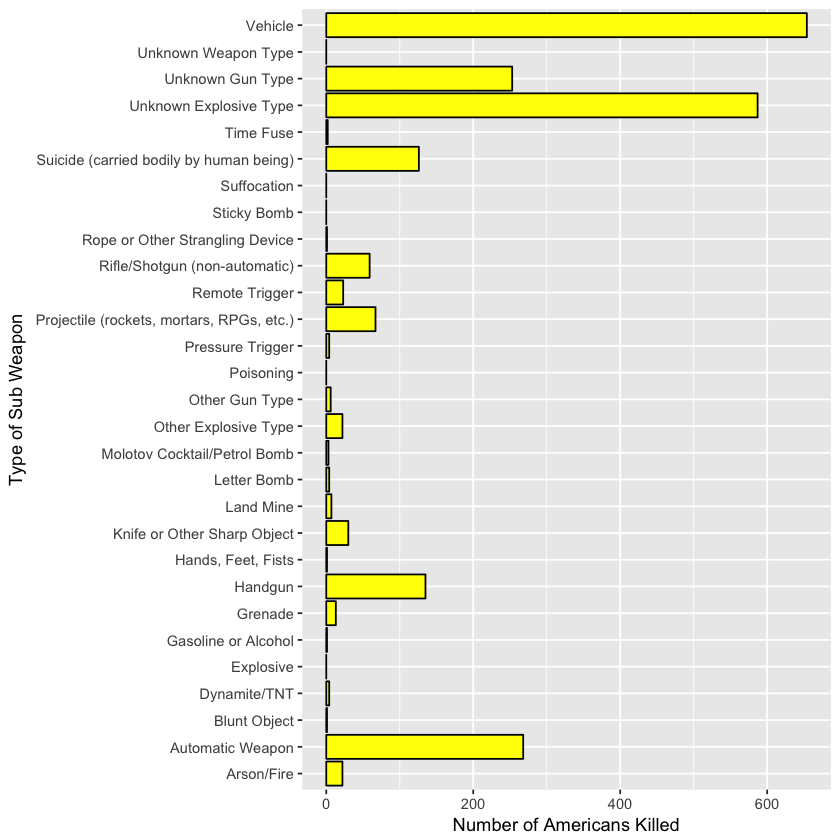

In [39]:
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
group_by(weapsubtype1_txt) %>%
summarise(
    people_killed_by_weapon = sum(nkillus, na.rm = TRUE)
) %>%
ggplot(aes(weapsubtype1_txt, people_killed_by_weapon))+
geom_bar(stat = "identity", fill = "yellow", color = "black")+
coord_flip()+
ylab("Number of Americans Killed")+
xlab("Type of Sub Weapon")

Interestingly the highest number of American deaths are caused by vehicles! This is followed by unknown explosive type and automatic weapons (obviously!)

## **Number of deaths by weapons throughout the world**

In [40]:
options(repr.plot.width = 10, repr.plot.height = 10)

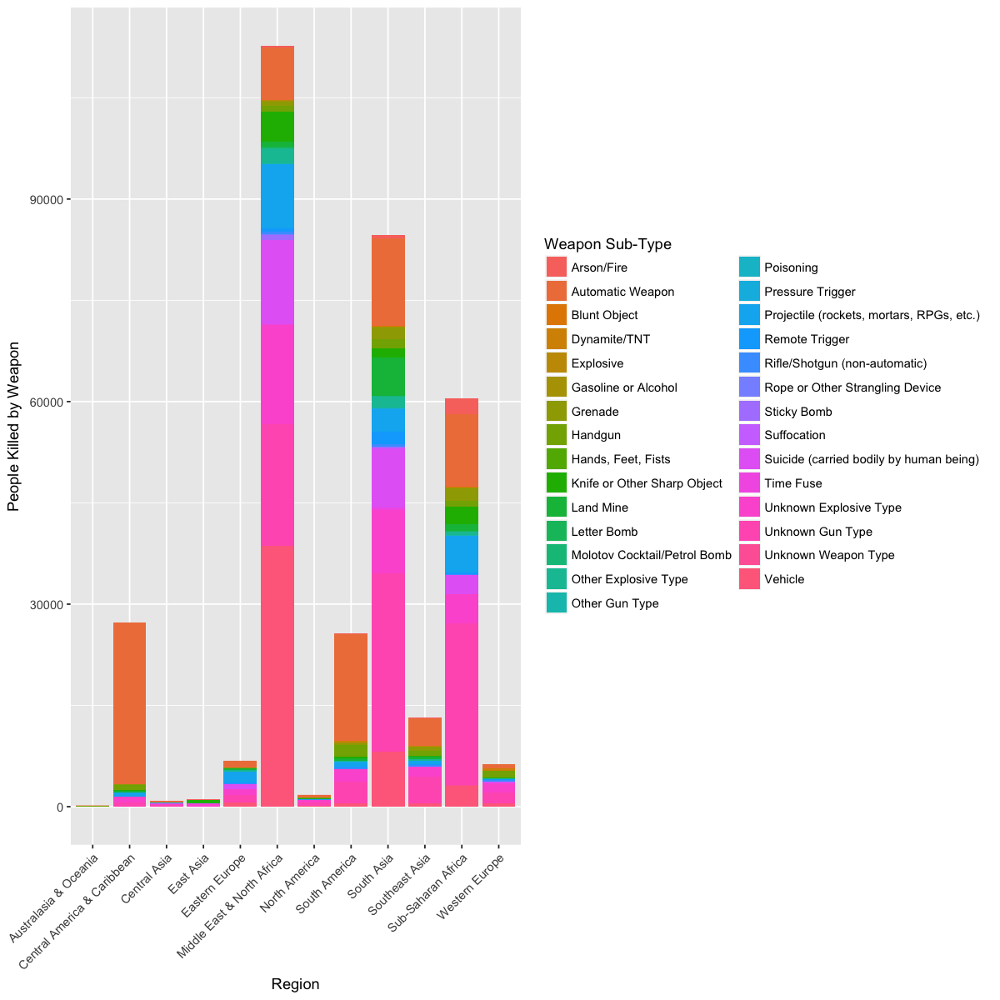

In [41]:
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
group_by(region_txt, weapsubtype1_txt) %>%
summarise(
    people_killed_by_weapon = sum(nkill, na.rm = TRUE)
) %>%
ggplot(aes(region_txt, people_killed_by_weapon))+
geom_bar(aes(fill = weapsubtype1_txt), stat = "identity", size = 0.9)+
theme(axis.text.x = element_text(angle = 45, hjust = 1))+
ylab("People Killed by Weapon")+
xlab("Region")+
guides(fill = guide_legend(title = "Weapon Sub-Type"))

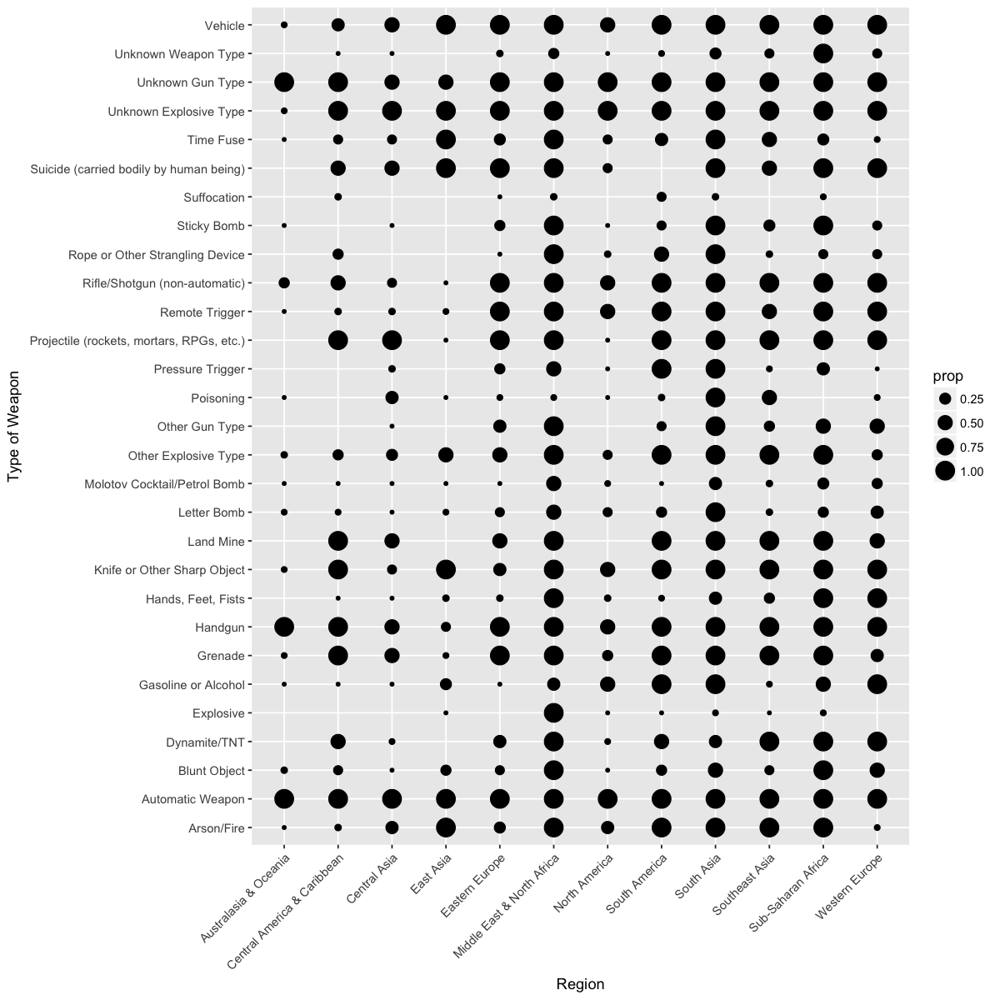

In [42]:
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
group_by(region_txt, weapsubtype1_txt) %>%
summarise(
    people_killed_by_weapon = sum(nkill, na.rm = TRUE)
) %>%
ggplot(aes(region_txt, weapsubtype1_txt))+
geom_count(aes(size = ..prop.., group = people_killed_by_weapon))+
theme(axis.text.x = element_text(angle = 45, hjust = 1))+
ylab("Type of Weapon")+
xlab("Region")+
guides(fill = guide_legend(title = "Proportion of People Killed by Weapons"))

## **Analysis of sub-weapon types across the years**

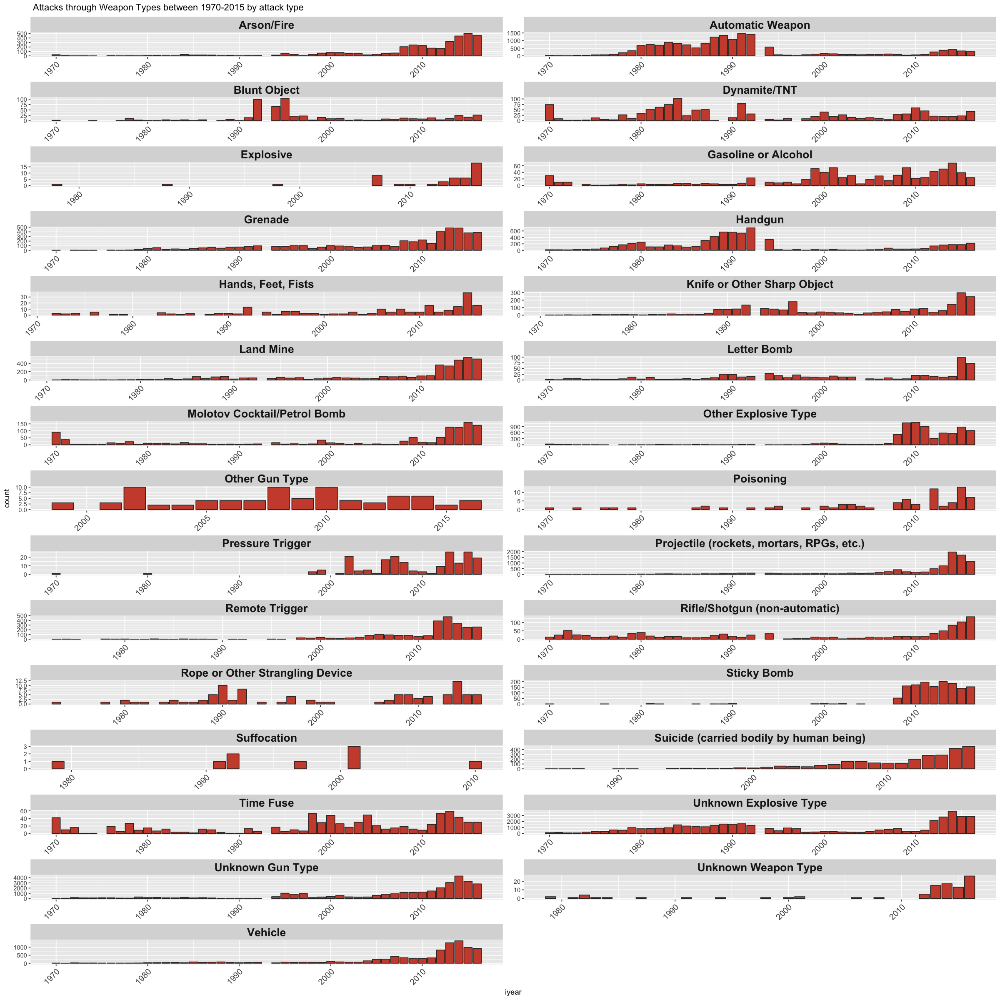

In [43]:
options(repr.plot.width = 20, repr.plot.height = 20)
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
ggplot(aes(x = iyear))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~weapsubtype1_txt, scales = "free", ncol = 2)+ 
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))+
labs(title =" Attacks through Weapon Types between 1970-2015 by attack type", size = 15)

## **Analysis of sub-weapon types in different regions**

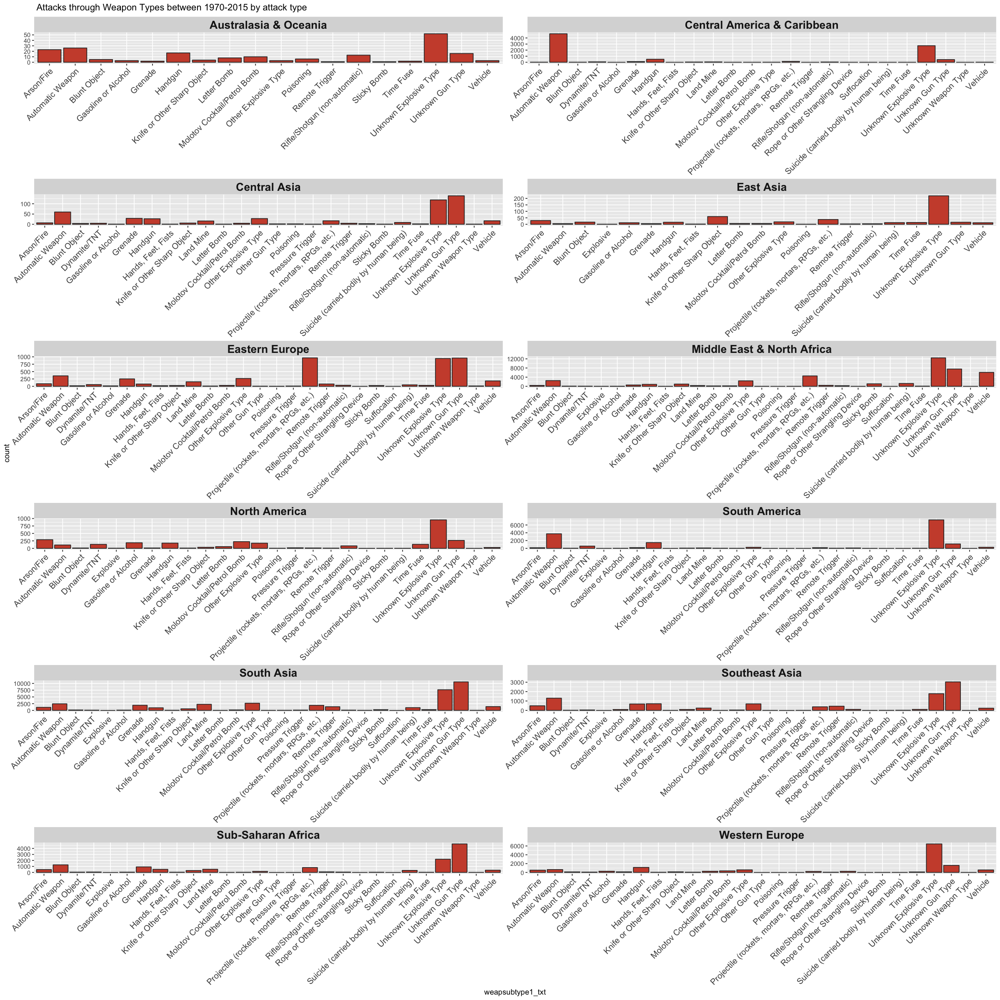

In [44]:
options(repr.plot.width = 20, repr.plot.height = 20)
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
ggplot(aes(x = weapsubtype1_txt))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~region_txt, scales = "free", ncol = 2)+ 
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))+
labs(title =" Attacks through Weapon Types between 1970-2015 by attack type", size = 15)

Each of the attack type has increased over the years.

## **Analysis of sub-weapon types in USA**

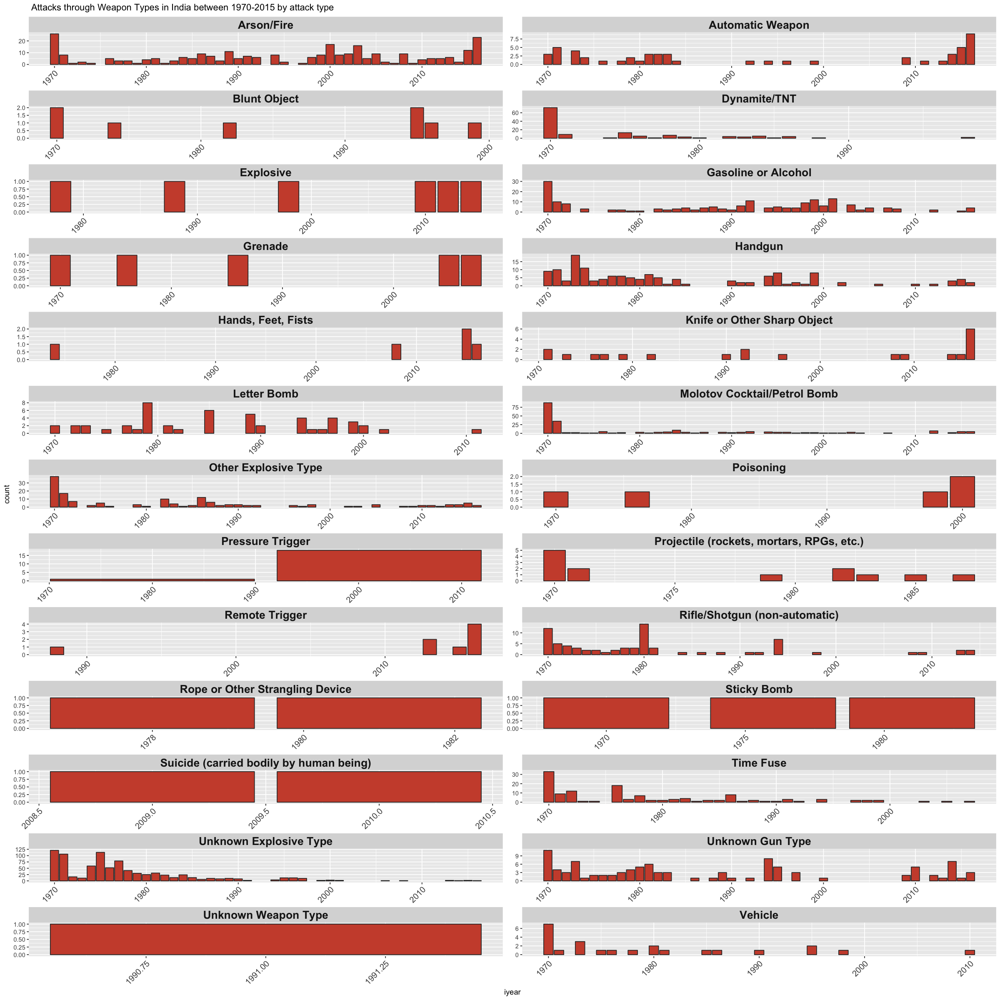

In [45]:
options(repr.plot.width = 20, repr.plot.height = 20)
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
filter(country_txt == "United States") %>%
ggplot(aes(x = iyear))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~weapsubtype1_txt, scales = "free", ncol = 2)+ 
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))+
labs(title =" Attacks through Weapon Types in India between 1970-2015 by attack type", size = 15)

## **Analysis of sub-weapon types in India**

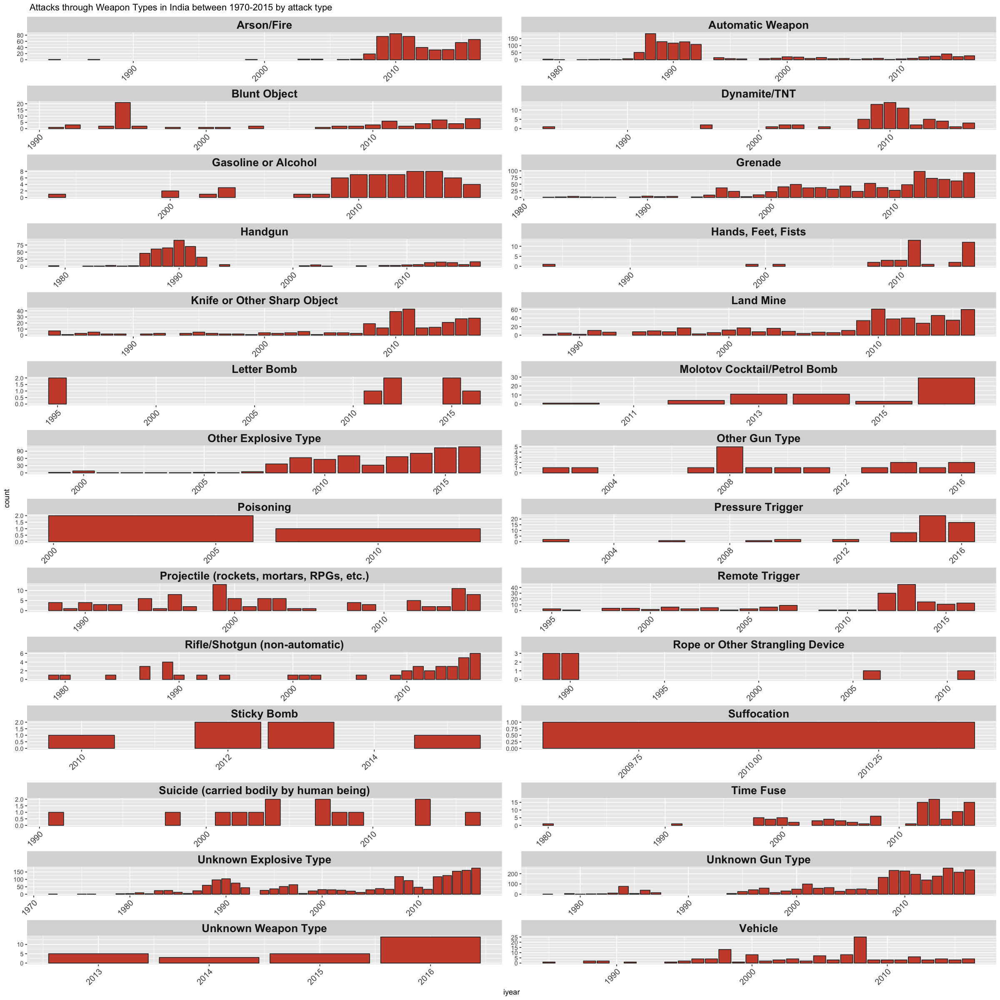

In [46]:
options(repr.plot.width = 20, repr.plot.height = 20)
df %>%
filter(!is.na(weapsubtype1_txt)) %>%
filter(country_txt == "India") %>%
ggplot(aes(x = iyear))+ 
geom_bar(colour = "grey19", fill = "tomato3")+ 
facet_wrap(~weapsubtype1_txt, scales = "free", ncol = 2)+ 
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))+
labs(title =" Attacks through Weapon Types in India between 1970-2015 by attack type", size = 15)

## **Number of people killed by the perpetrator groups**
Finally lets see which terrorist group has killed the highest number of people

Selecting by nkills


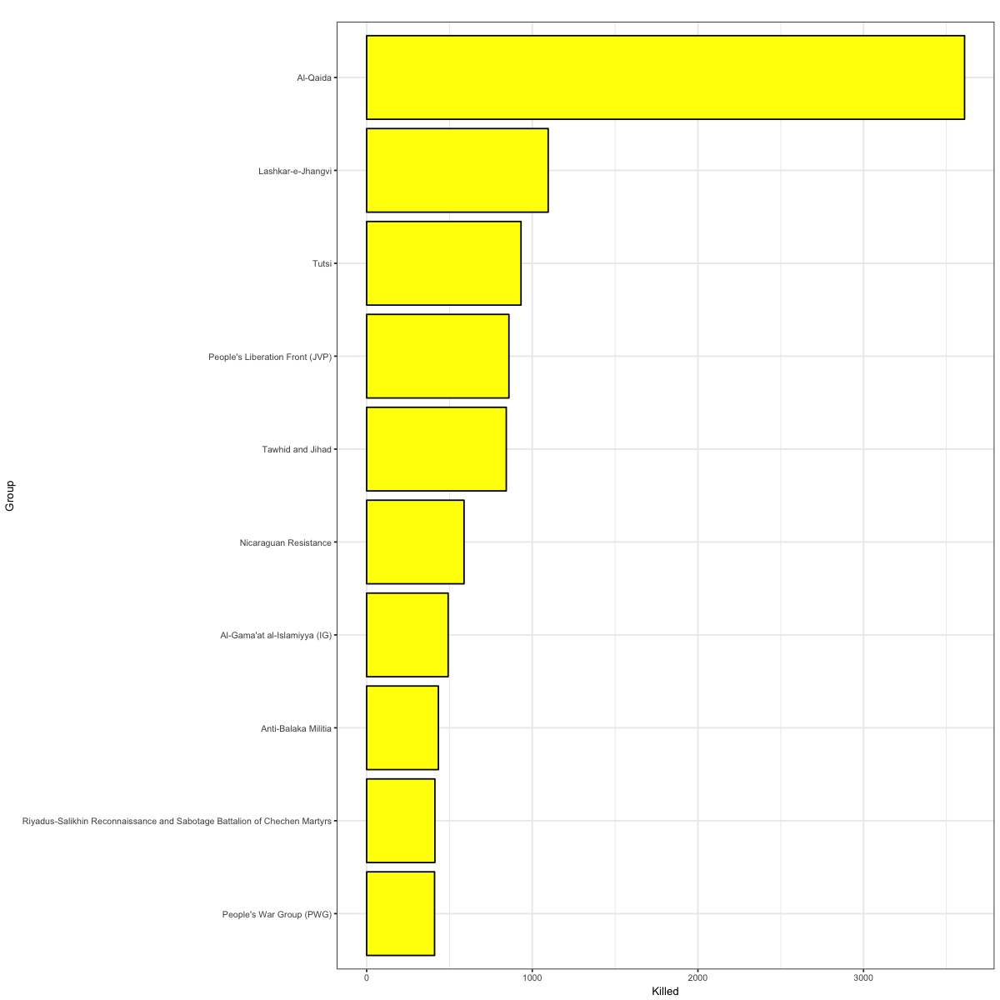

In [64]:
options(repr.plot.width = 10, repr.plot.height = 10)
df %>% 
group_by(gname) %>%
summarise(
    nkills = sum(nkill),
) %>%
top_n(n = 10) %>%
ggplot(aes(x = reorder(gname, nkills), y = nkills))+
geom_bar(fill = "yellow", stat="identity", colour="black")+
coord_flip()+
theme_bw(base_size = 8)+
labs(title="", x ="Group", y = "Killed")

Al-Qaida has the highest number of deaths/people killed.

## **Number of people wounded by terrorist groups**

Selecting by nwounded


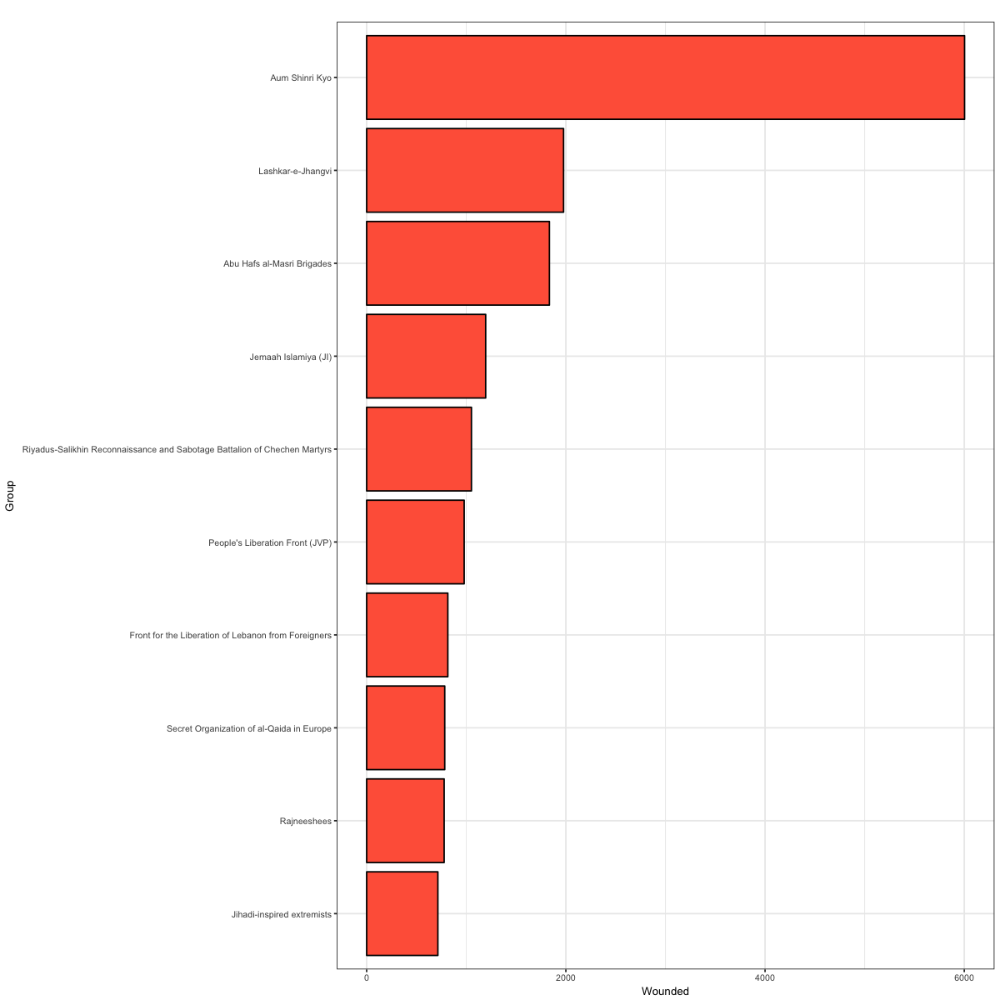

In [48]:
options(repr.plot.width = 10, repr.plot.height = 10)
df %>% 
group_by(gname) %>%
summarise(
    nwounded = sum(nwound),
) %>%
top_n(n = 10) %>%
ggplot(aes(x = reorder(gname, nwounded), y = nwounded))+
geom_bar(fill = "tomato", stat="identity", colour="black")+
coord_flip()+
theme_bw(base_size = 8)+
labs(title="", x ="Group", y = "Wounded")

## **Types of weapons used by terrorist groups**
We will look at the preferred weapons used by the top 10 terrorist groups


In [82]:
df_1 <- df %>% 
group_by(gname) %>% 
summarise(nkills = sum(nkill)) %>% 
top_n(n = 30) %>% 
ungroup()

df_2 <- merge(df, df_1, by = "gname", all.y = TRUE)

Selecting by nkills


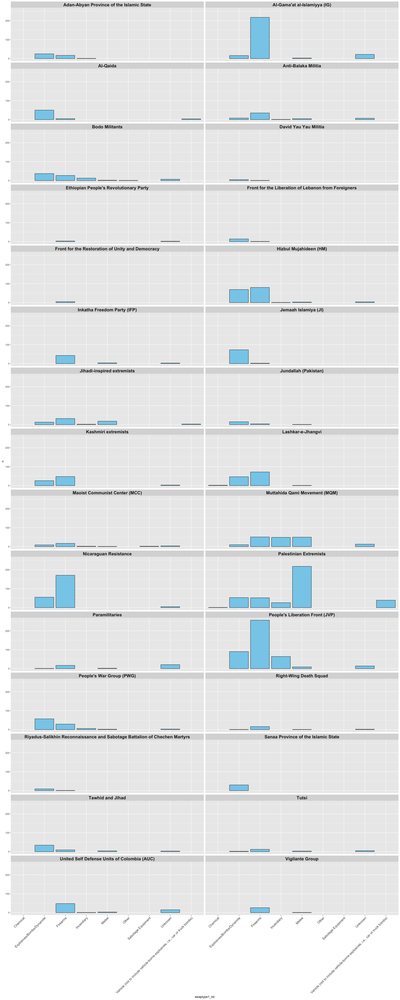

In [73]:
options(repr.plot.width = 20, repr.plot.height = 50)
df_2 %>%
count(gname, weaptype1_txt) %>%
ggplot(aes(x = weaptype1_txt, y = n))+
geom_bar(colour = "grey19", fill = "skyblue", stat = "identity")+
facet_wrap(~gname, ncol = 2)+
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))

It seems different groups use different methods with bombing and firearms topping the list. However, groups like People Liberation Squad and Right-Wing Death Squad do use other methods like melee and incendiary

## **Types of weapon sub-types used by terrorist groups**

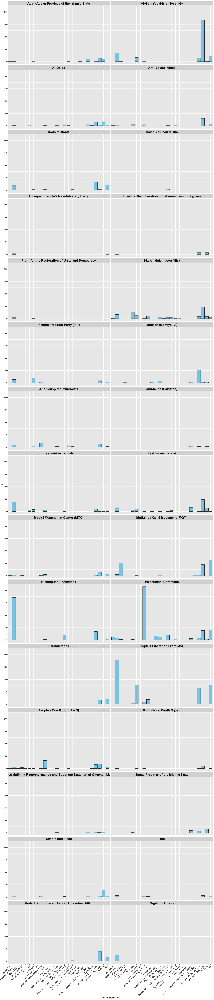

In [79]:
options(repr.plot.width = 15, repr.plot.height = 70)
df_2 %>%
count(gname, weapsubtype1_txt) %>%
ggplot(aes(x = weapsubtype1_txt, y = n))+
geom_bar(colour = "grey19", fill = "skyblue", stat = "identity")+
facet_wrap(~gname, ncol = 2)+
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12))+
theme(strip.text = element_text(size = 16, face = "bold"))

## **Regions in which these groups operate**
We look at whether these terrorist groups operate more in certain regions or not and which ones

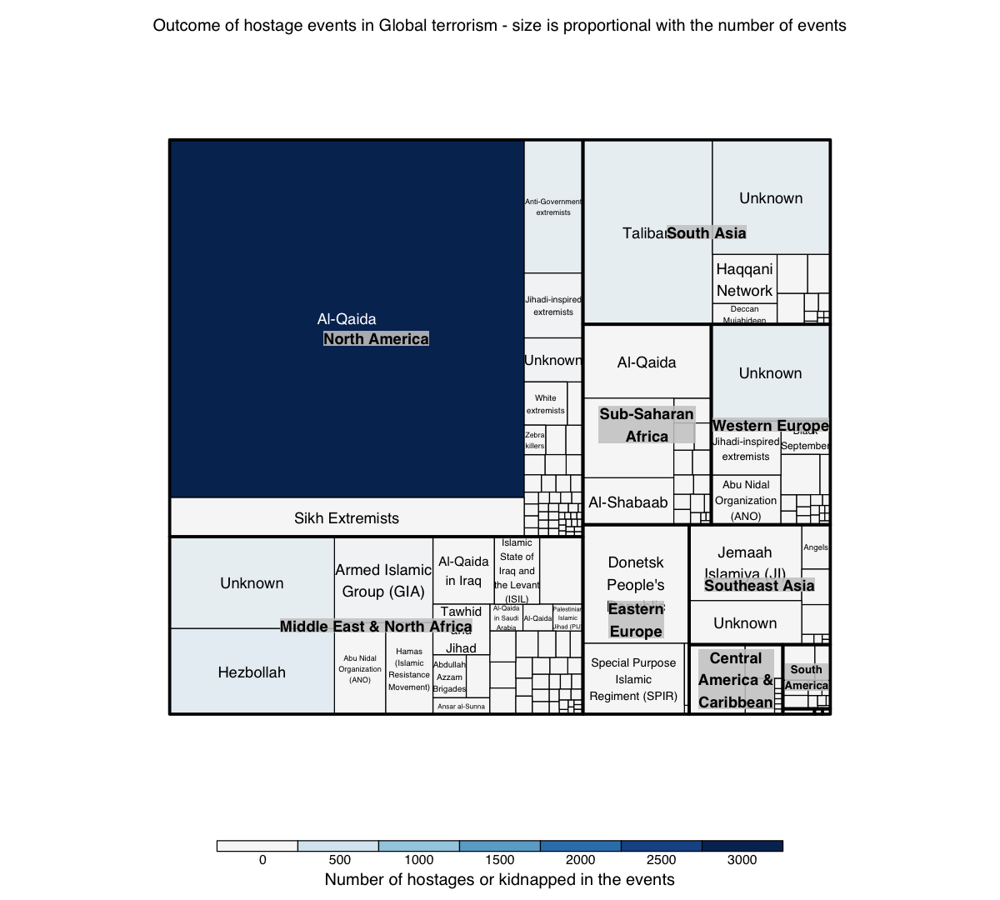

In [109]:
options(repr.plot.width = 10, repr.plot.height = 9)
df %>%
filter(nkillus > 0 & nkill > 0) %>%
treemap(index = c("region_txt", "gname"),
        type = "value",
        vSize = "nkill",
        vColor = "nkillus",
        palette = "RdBu",  
        title = "Outcome of hostage events in Global terrorism - size is proportional with the number of events", 
        title.legend = "Number of hostages or kidnapped in the events",
        fontsize.title = 12
       )